# Peaks analysis

Peaks / lengths / differences / jaccard etc.

In [1]:
from operator import invert

from immgen import load_or_compute
%matplotlib inline
%config InlineBackend.figure_format='retina'

import pandas as pd
import seaborn as sns
from IPython.display import display
from tqdm.auto import tqdm

import matplotlib.pyplot as plt
import numpy as np
import os
import re
from itertools import product
import tempfile
from statannotations.Annotator import Annotator
sns.set_context("paper", rc={"font.size":8})

sns.set_theme(style="whitegrid")

In [2]:
def bedl(file):
    try:
        tf = pd.read_csv(file, sep='\t', header=None, usecols=[1, 2])
        return tf[2] - tf[1]
    except:
        return np.zeros(0)  # Empty file


def lines(file):
    try:
        tf = pd.read_csv(file, sep='\t', header=None)
        return len(tf)
    except:
        return 0  # Empty file


def d(a, b):
    return a / b if b != 0 else 0


def last_col(file):
    try:
        cols = len(pd.read_csv(file, sep='\t', nrows=1, header=None).columns)
        return pd.read_csv(file, sep='\t', header=None, usecols=[cols - 1])[cols - 1]
    except:
        return np.zeros(0)  # Empty file


def sorted_file(file):
    ts = tempfile.mktemp()
    ! cat {file} | sort -k1,1 -k2,2n -k3,3n > {ts}
    # Fixes of problems with peakseq output
    ! sed -E -i 's/[[:space:]]+/\t/g' {ts}
    ! sed -E -i 's/\t$//g' {ts}
    return ts


def sorted_file3(file):
    ts = tempfile.mktemp()
    ! cat {file} | cut -f1-3 | sort -k1,1 -k2,2n -k3,3n > {ts}
    # Fixes of problems with peakseq output
    ! sed -E -i 's/[[:space:]]+/\t/g' {ts}
    ! sed -E -i 's/\t$//g' {ts}
    return ts

def load_or_compute(path, compute):
    if os.path.exists(path):
        return pd.read_csv(path, sep='\t')
    else:
        df = compute()
        df.to_csv(path, sep='\t', index=False)
        return df

# Load peaks


In [3]:
GSE26320_PATH = os.path.expanduser('~/data/2023_GSE26320')
GSE26320_CELLS = ['GM12878', 'HMEC', 'HSMM', 'K562', 'NHEK', 'NHLF', 'H1', 'Huvec', 'HepG2']
MODIFICATIONS = ['H3K4me3', 'H3K27ac', 'H3K4me1', 'H3K27me3', 'H3K36me3']
GSE26320_REPS = ['rep1', 'rep2']

IMMUNE_PATH = os.path.expanduser('~/data/2023_Immune')
IMMUNE_CELLS = ['CD4ABT', 'TCellBB', 'BCell', 'TCell', 'Monocyte', 'PBMC', 'NK', 'CD34', 'CD4', ]  ## Longest first
IMMUNE_REPS = ['rep1', 'rep2', 'rep3', '']

ABF_PATH = os.path.expanduser('~/data/2018_chipseq_y20o20')
ABF_MODIFICATIONS = ['k4me3', 'k27ac', 'k4me1', 'k27me3', 'k36me3']
ABF_REPLICATES = [f'OD{i}' for i in range(1, 30)] + [f'YD{i}' for i in range(1, 30)]

! mkdir -p {GSE26320_PATH}/pics
! mkdir -p {IMMUNE_PATH}/pics
! mkdir -p {ABF_PATH}/pics

In [4]:
import matplotlib.colors as mc
import colorsys
def adjust_lightness(c, amount=0.5):
    c = colorsys.rgb_to_hls(*mc.to_rgb(c))
    return colorsys.hls_to_rgb(c[0], max(0, min(1, amount * c[1])), c[2])

TOOLS = ['MACS2', 'SICER', 'Omnipeak', 'HOMER', 'Hotspot', 'Peakseq', 'LanceOtron']
palette = plt.get_cmap('tab10')
TOOLS_PALETTE = {t: palette(i) for i, t in enumerate(TOOLS)}

TOOLS_PALETTE['MACS2 broad'] = adjust_lightness(TOOLS_PALETTE['MACS2'])
TOOLS_PALETTE['HOMER histone'] = adjust_lightness(TOOLS_PALETTE['HOMER'])

TOOLS = ['MACS2', 'MACS2 broad', 'SICER', 'HOMER', 'HOMER histone', 'Hotspot', 'Peakseq', 'LanceOtron', 'Omnipeak']

In [5]:
def load_peaks(path, suffix, modifications, cells, replicates):
    df = pd.DataFrame(columns=['file', 'modification', 'cell', 'replicate', 'peaks'],
                      dtype=object)
    if not os.path.exists(path):
        return df
    for f in tqdm(os.listdir(path)):
        if not f.endswith(suffix):
            continue
        mod = next((m for m in modifications if f'{m}_' in f), None)
        cell = '' if '' in cells else next((c for c in cells if f'{c}_' in f), None)
        rep = next((r for r in replicates if f'_{r}_' in f or f'_{r}-' in f or f'_{r}.' in f or f.startswith(f'{r}_')),
                   None)
        if rep is None and '' in replicates:
            rep = ''
        if mod and cell is not None and rep is not None:
            peaks_path = os.path.join(path, f)
            ps = lines(peaks_path)
            df.loc[len(df)] = (peaks_path, mod, cell, rep, ps)
    return df

In [6]:
def load_peaks_path(path, modifications, cells, replicates):
    df_macs2 = load_peaks(os.path.join(path, 'macs2'), '.narrowPeak', modifications, cells, replicates)
    df_macs2['tool'] = 'MACS2'
    print('MACS2', len(df_macs2))

    df_macs2broad = load_peaks(os.path.join(path, 'macs2'), '.broadPeak', modifications, cells, replicates)
    df_macs2broad['tool'] = 'MACS2 broad'
    print('MACS2 broad', len(df_macs2broad))

    df_sicer = load_peaks(os.path.join(path, 'sicer'), 'summary-FDR0.01', modifications, cells, replicates)
    df_sicer['tool'] = 'SICER'
    print('SICER', len(df_sicer))

    df_omnipeak = load_peaks(os.path.join(path, 'omnipeak'), '.peak', modifications, cells, replicates)
    df_omnipeak['tool'] = 'Omnipeak'
    print('Omnipeak', len(df_omnipeak))

    df_homer = load_peaks(os.path.join(path, 'homer'), '_peaks.bed', modifications, cells, replicates)
    df_homer['tool'] = 'HOMER'
    print('HOMER', len(df_homer))

    df_homer_histone = load_peaks(os.path.join(path, 'homer'), '_regions.bed', modifications, cells, replicates)
    df_homer_histone['tool'] = 'HOMER histone'
    print('HOMER histone', len(df_homer_histone))

    df_hotspot = load_peaks(os.path.join(path, 'hotspot'), '.peak', modifications, cells, replicates)
    df_hotspot['tool'] = 'Hotspot'
    print('Hotspot', len(df_hotspot))

    df_peakseq = load_peaks(os.path.join(path, 'peakseq'), '.narrowPeak', modifications, cells, replicates)
    df_peakseq['tool'] = 'Peakseq'
    print('Peakseq', len(df_peakseq))

    df_lanceotron = load_peaks(os.path.join(path, 'lanceotron'), '.bed', modifications, cells, replicates)
    df_lanceotron['tool'] = 'LanceOtron'
    print('LanceOtron', len(df_lanceotron))

    return pd.concat(
        [df_macs2, df_macs2broad, df_sicer, df_omnipeak, df_homer, df_homer_histone, df_hotspot, df_peakseq,
         df_lanceotron]
    ).reset_index(drop=True)

In [18]:
df_encode_peaks_path = GSE26320_PATH + '/df_encode_peaks.tsv'
df_encode_peaks = load_or_compute(df_encode_peaks_path, lambda :load_peaks_path(GSE26320_PATH, MODIFICATIONS, GSE26320_CELLS, GSE26320_REPS))
df_encode_peaks['dataset'] = 'ENCODE'
df_encode_peaks.sample(5)

,file,modification,cell,replicate,peaks,tool,dataset
249,/home/jetbrains/data/2023_GSE26320/sicer/GSM64...,H3K27me3,HepG2,rep2,31418,SICER,ENCODE
209,/home/jetbrains/data/2023_GSE26320/sicer/GSM64...,H3K4me3,K562,rep1,30206,SICER,ENCODE
143,/home/jetbrains/data/2023_GSE26320/macs2/GSM64...,H3K4me3,GM12878,rep1,40073,MACS2 broad,ENCODE
416,/home/jetbrains/data/2023_GSE26320/homer/GSM64...,H3K27me3,Huvec,rep2,3080,HOMER,ENCODE
566,/home/jetbrains/data/2023_GSE26320/hotspot/GSM...,H3K27ac,Huvec,rep1,121248,Hotspot,ENCODE


In [20]:
df_immune_peaks_path = IMMUNE_PATH + '/df_immune_peaks.tsv'
df_immune_peaks = load_or_compute(df_immune_peaks_path,
                                  lambda : load_peaks_path(IMMUNE_PATH, MODIFICATIONS, IMMUNE_CELLS, IMMUNE_REPS))
df_immune_peaks['dataset'] = 'Roadmap'
df_immune_peaks.sample(5)

,file,modification,cell,replicate,peaks,tool,dataset
314,/home/jetbrains/data/2023_Immune/hotspot/CD34_...,H3K27ac,CD34,NaN,177055,Hotspot,Roadmap
101,/home/jetbrains/data/2023_Immune/sicer/PBMC_H3...,H3K27me3,PBMC,NaN,36215,SICER,Roadmap
345,/home/jetbrains/data/2023_Immune/peakseq/NK_H3...,H3K4me1,NK,NaN,23347,Peakseq,Roadmap
122,/home/jetbrains/data/2023_Immune/sicer/BCell_H...,H3K27ac,BCell,NaN,24342,SICER,Roadmap
78,/home/jetbrains/data/2023_Immune/macs2/TCell_H...,H3K27me3,TCell,NaN,339795,MACS2 broad,Roadmap


In [9]:
def update_abf_modifications(df):
    df.loc[df['modification'] == 'k4me3', 'modification'] = 'H3K4me3'
    df.loc[df['modification'] == 'k27ac', 'modification'] = 'H3K27ac'
    df.loc[df['modification'] == 'k4me1', 'modification'] = 'H3K4me1'
    df.loc[df['modification'] == 'k27me3', 'modification'] = 'H3K27me3'
    df.loc[df['modification'] == 'k36me3', 'modification'] = 'H3K36me3'

In [22]:
df_abf_peaks_all_path = GSE26320_PATH + '/df_abf_peaks_all.tsv'
df_abf_peaks_all = load_or_compute(df_abf_peaks_all_path,
                                   lambda : load_peaks_path(ABF_PATH, ABF_MODIFICATIONS, [''], ABF_REPLICATES))
update_abf_modifications(df_abf_peaks_all)
df_abf_peaks_all['cell'] = ['OD' if 'OD' in r else 'YD' for r in df_abf_peaks_all['replicate']]
df_abf_peaks_all['dataset'] = 'ABF'
# Drop outliers
ABF_OUTLIERS = {'k27ac': ['YD1', 'YD6'],
                'k27me3': ['OD9', 'YD1', 'YD2', 'YD3', 'YD4', 'YD9', 'YD10', 'YD11'],
                'k36me3': ['OD3', 'OD6', 'OD12', 'OD18', 'OD20', 'YD1', 'YD3', 'YD4', 'YD5'],
                'k4me3': ['OD6', 'OD7', 'OD14', 'YD2', 'YD3', 'YD10', 'YD14']}
t_outliers = [any(f'{o}_h3{m}'.lower() in f.lower() or f'{o}_{m}'.lower() in f.lower()
                  for m, ol in ABF_OUTLIERS.items() for o in ol)
              for f in df_abf_peaks_all['file']]
print('Total outliers', sum(t_outliers))
df_abf_peaks = df_abf_peaks_all[[not to for to in t_outliers]]

df_abf_peaks.sample(5)

Total outliers 210


,file,modification,cell,replicate,peaks,tool,dataset
1083,/home/jetbrains/data/2018_chipseq_y20o20/homer...,H3K36me3,YD,YD10,74302,HOMER histone,ABF
181,/home/jetbrains/data/2018_chipseq_y20o20/macs2...,H3K4me3,OD,OD8,33558,MACS2,ABF
1601,/home/jetbrains/data/2018_chipseq_y20o20/lance...,H3K4me1,OD,OD7,98967,LanceOtron,ABF
822,/home/jetbrains/data/2018_chipseq_y20o20/homer...,H3K4me3,OD,OD5,9349,HOMER,ABF
1177,/home/jetbrains/data/2018_chipseq_y20o20/hotsp...,H3K36me3,YD,YD8,478953,Hotspot,ABF


In [23]:
df_peaks_full = pd.concat([df_encode_peaks, df_immune_peaks, df_abf_peaks]).reset_index(drop=True)

In [24]:
# Remove outliers
OUTLIERS = [
    ('H3K4me3', 'NK', ''),
    ('H3K27ac', 'CD34', 'rep2'),
    ('H3K4me1', 'NK', ''),
    ('H3K27me3', 'BCell', ''),
    ('H3K27me3', 'TCell', ''),
    ('H3K27me3', 'NK', ''),
]
df_peaks = df_peaks_full.loc[[(m, c, r) not in OUTLIERS
                              for _, (m, c, r) in
                              df_peaks_full[['modification', 'cell', 'replicate']].iterrows()]].copy()

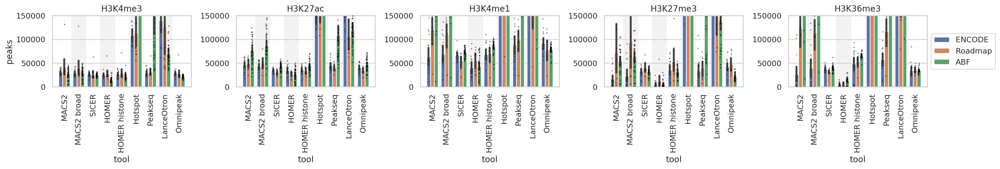

In [45]:
sns.set_style('whitegrid')
plt.figure(figsize=(20, 3.5))
axs = [plt.subplot(1, 5, i + 1) for i in range(5)]
for i, m in enumerate(MODIFICATIONS):
    ax = axs[i]
    dfm = df_peaks[df_peaks['modification'] == m]
    sns.barplot(data=dfm, x='tool', y='peaks', hue='dataset',
                # capsize=.2, err_kws={'linewidth': 2}, edgecolor="black",
                order=TOOLS,
                hue_order=['ENCODE', 'Roadmap', 'ABF'],
                ax=ax)
    sns.stripplot(data=dfm, x='tool', y='peaks', hue='dataset',
                  dodge=True, size=2, palette='dark:black', alpha=0.5,
                  order=TOOLS,
                  hue_order=['ENCODE', 'Roadmap', 'ABF'],
                  legend=False,
                  ax=ax)
    ax.xaxis.set_tick_params(rotation=90)
    ax.title.set_text(m)
    if i > 0:
        ax.set_ylabel(None)
    else:
        ax.set_ylabel('peaks')
    if i < len(axs) - 1:
        ax.legend().set_visible(False)
    else:
        # Put a legend to the right of the current axis
        ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax.set_ylim(bottom=0, top=150_000)
    # Add light-grey bands for odd categories
    for k in range(len(ax.get_xticks())):
        if k % 2:  # odd
            ax.axvspan(k - 0.5, k + 0.5, zorder=0, color="0.95")
plt.tight_layout()
plt.show()

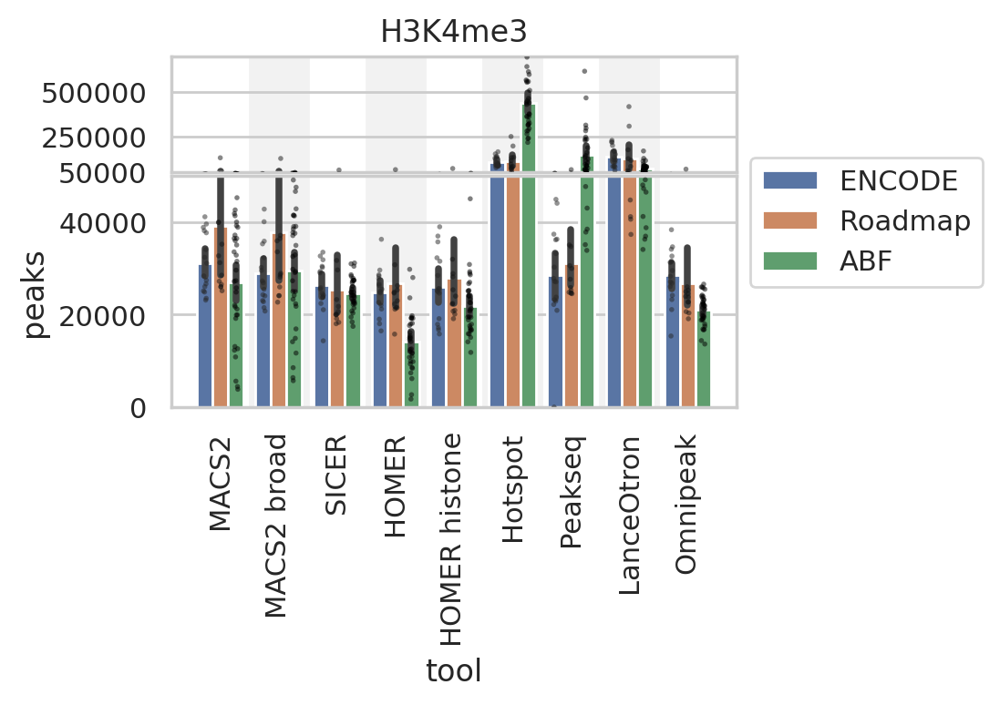

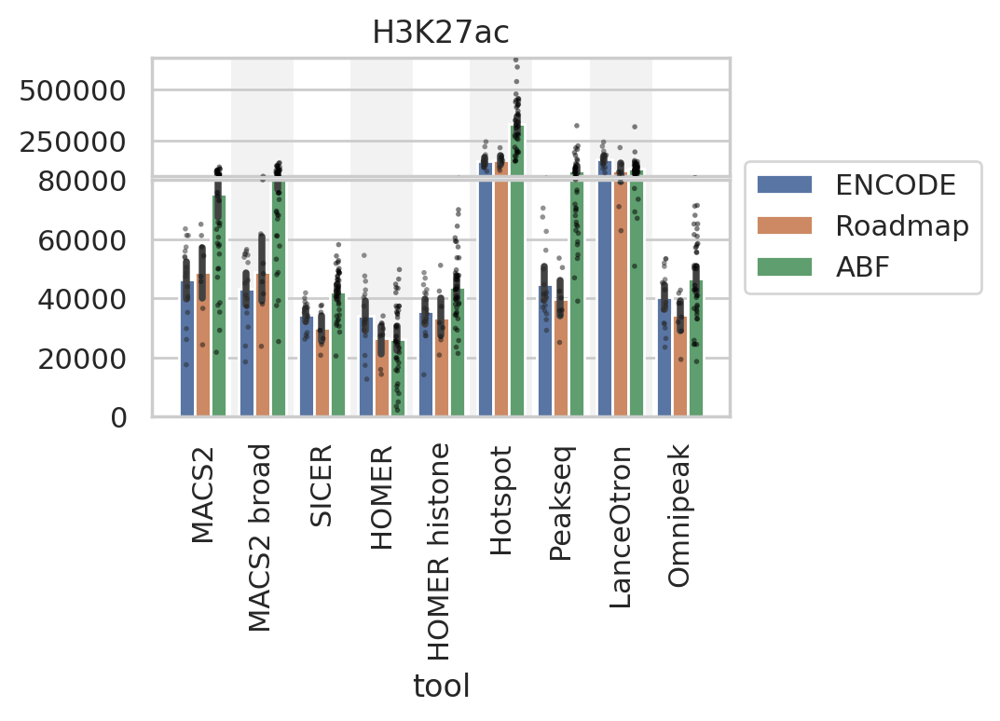

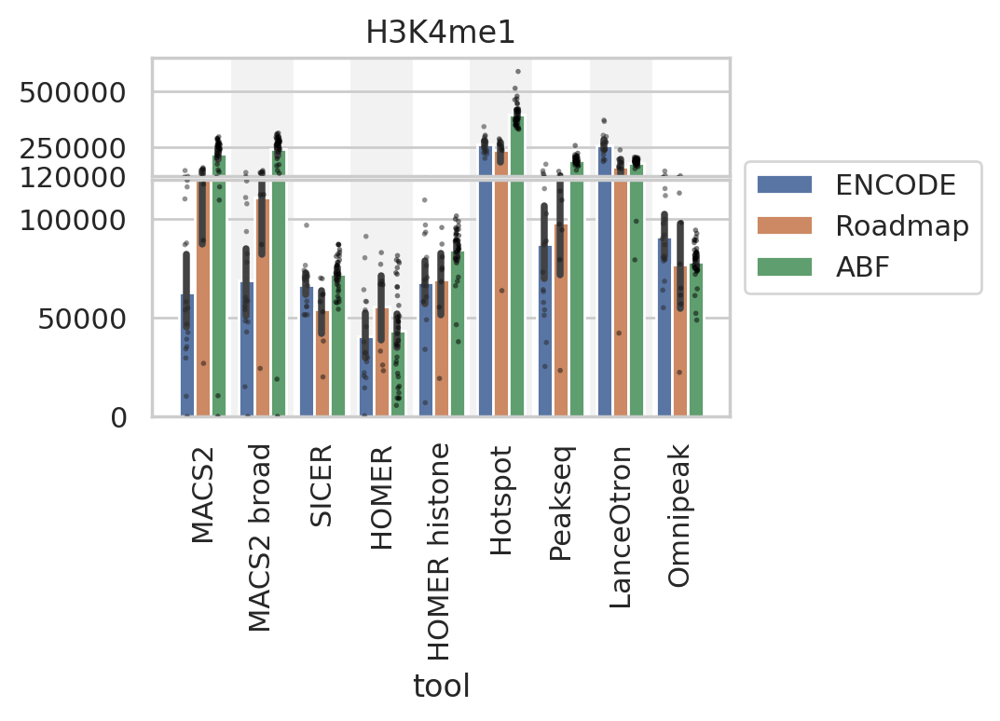

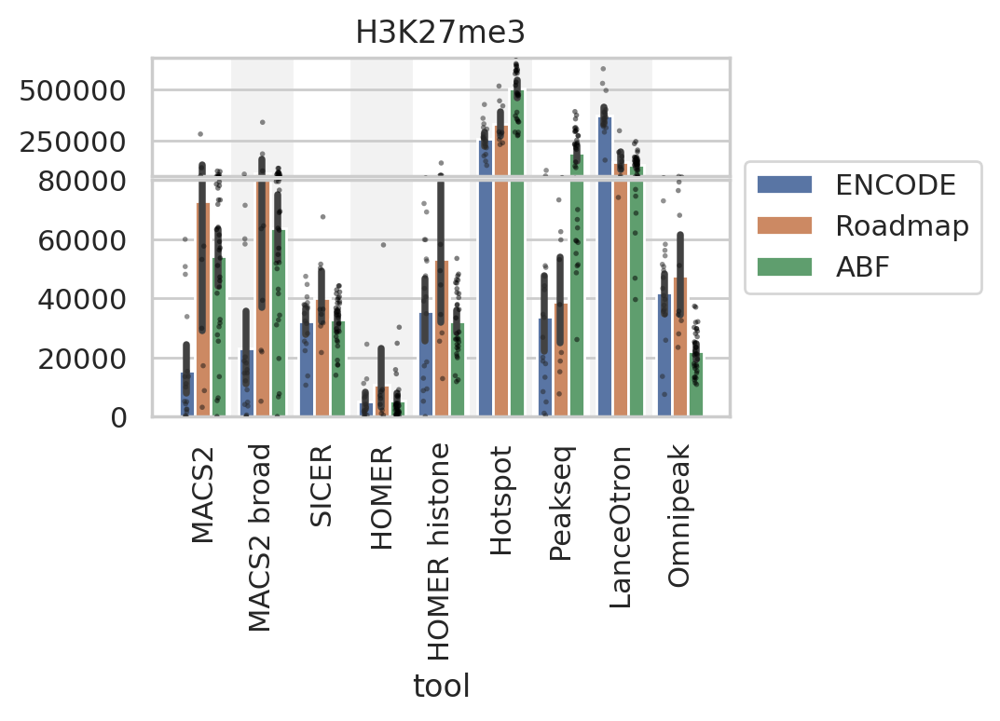

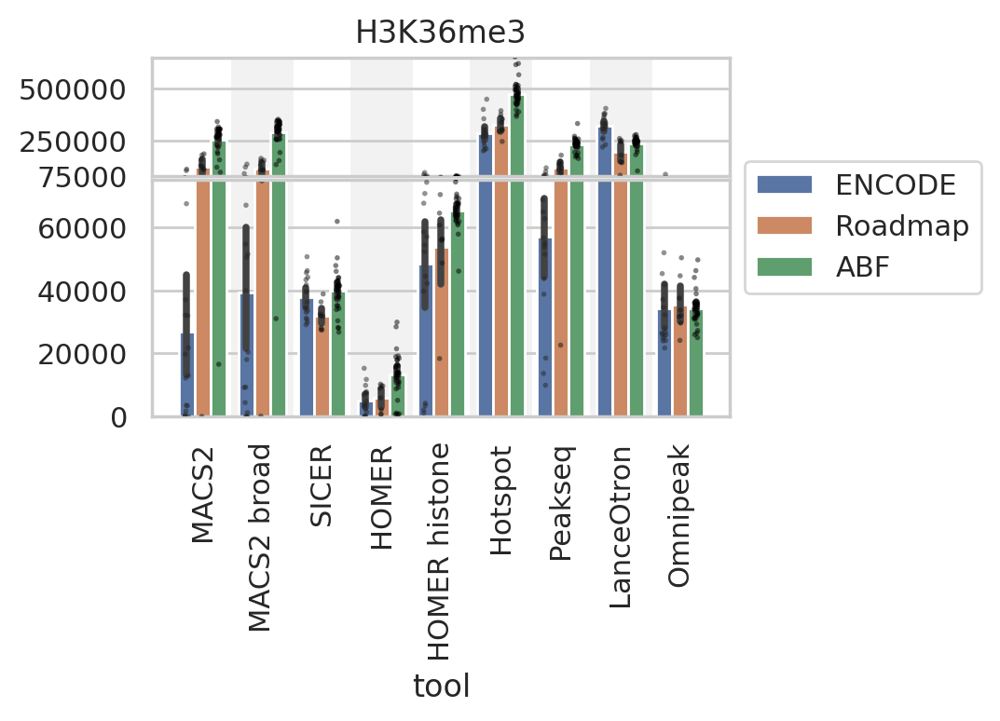

In [46]:
sns.set_style('whitegrid')
for i, m in enumerate(MODIFICATIONS):
    dfm = df_peaks[df_peaks['modification'] == m]
    # Set up the matplotlib figure with broken y-axis
    f, (axt, ax) = plt.subplots(2, 1, sharex=True, figsize=(4, 2.5),
                                gridspec_kw={'height_ratios': [1, 2]})
    for j, axes in enumerate([ax, axt]):
        sns.barplot(data=dfm, x='tool', y='peaks', hue='dataset',
                    order=TOOLS,
                    hue_order=['ENCODE', 'Roadmap', 'ABF'],
                    ax=axes)
        sns.stripplot(data=dfm, x='tool', y='peaks', hue='dataset',
                      dodge=True, size=2, palette='dark:black', alpha=0.5,
                      order=TOOLS,
                      hue_order=['ENCODE', 'Roadmap', 'ABF'],
                      legend=False,
                      ax=axes)
        # Add light-grey bands for odd categories
        for k in range(len(axes.get_xticks())):
            if k % 2:  # odd
                axes.axvspan(k - 0.5, k + 0.5, zorder=0, color="0.95")

    if m == 'H3K4me3':
        ax.set_ylim(bottom=0, top=50_000)
        axt.set_ylim(bottom=50_000, top=700_000)
        axt.set_yticks([50_000, 250_000, 500_000])
    elif m == 'H3K27ac':
        ax.set_ylim(bottom=0, top=80_000)
        axt.set_ylim(bottom=80_000, top=650_000)
        axt.set_yticks([250_000, 500_000])
    elif m == 'H3K4me1':
        ax.set_ylim(bottom=0, top=120_000)
        axt.set_ylim(bottom=120_000, top=650_000)
        axt.set_yticks([120_000, 250_000, 500_000])
    elif m == 'H3K27me3':
        ax.set_ylim(bottom=0, top=80_000)
        axt.set_ylim(bottom=80_000, top=650_000)
        axt.set_yticks([250_000, 500_000])
    elif m == 'H3K36me3':
        ax.set_ylim(bottom=0, top=75_000)
        axt.set_ylim(bottom=75_000, top=650_000)
        axt.set_yticks([75_000, 250_000, 500_000])

    axt.set_xlabel(None)
    axt.set_ylabel(None)
    ax.xaxis.set_tick_params(rotation=90)
    axt.title.set_text(m)
    if i > 0:
        ax.set_ylabel(None)
    else:
        ax.set_ylabel('peaks')
    axt.legend().set_visible(False)
    # Put a legend to the right of the current axis
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.8))
    # plt.tight_layout()
    plt.subplots_adjust(hspace=0.02)  # Adjust hspace closer to zero to remove spacing
    plt.show()

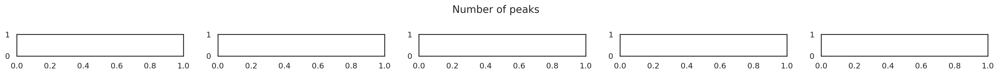

In [16]:
sns.set_theme(style="white")
fig = plt.figure(figsize=(20, 1.5))
fig.suptitle("Number of peaks", fontsize="large")
axs = [plt.subplot(1, 5, i + 1) for i in range(5)]
plt.tight_layout()
plt.show()
sns.set_theme(style="whitegrid")

# Lengths

In [32]:
def load_lens(df):
    print('Load lengths')
    ts = []
    for dataset, mod, cell, rep, file, tool in tqdm(list(zip(
            df['dataset'], df['modification'], df['cell'], df['replicate'], df['file'],
            df['tool']
    ))):
        lengths = bedl(file)
        t = pd.DataFrame(dict(length=lengths))
        t = t.sample(min(len(t), 10_000)).copy()
        t['dataset'] = dataset
        t['modification'] = mod
        t['cell'] = cell
        t['replicate'] = rep
        t['tool'] = tool
        t['footprint'] = sum(lengths)
        ts.append(t)
    df_lens = pd.concat(ts).reset_index(drop=True)
    del ts, t
    return df_lens

In [33]:
df_lens = load_lens(df_peaks)
df_lens.sample(10)

Load lengths


  0%|          | 0/2655 [00:00<?, ?it/s]

,length,dataset,modification,cell,replicate,tool,footprint
17626443,600.0,ABF,H3K4me1,YD,YD11,HOMER,12079800
14236005,195.0,ABF,H3K4me3,YD,YD9,MACS2 broad,14920666
22745191,200.0,ABF,H3K36me3,YD,YD21,Peakseq,92342173
23786867,514.0,ABF,H3K4me3,OD,OD5,Peakseq,32758297
15778807,3599.0,ABF,H3K36me3,YD,YD16,SICER,316752869
12653104,162.0,ABF,H3K27me3,YD,YD14,MACS2,8229124
18697333,1162.0,ABF,H3K27ac,YD,YD2,HOMER,3951962
7969273,665.0,Roadmap,H3K36me3,CD34,NaN,MACS2 broad,243757196
17059498,1035.0,ABF,H3K27ac,OD,OD20,Omnipeak,104678930
6602341,334.0,ENCODE,H3K27me3,NHLF,rep1,LanceOtron,138354596


H3K4me3
H3K27ac
H3K4me1
H3K27me3
H3K36me3


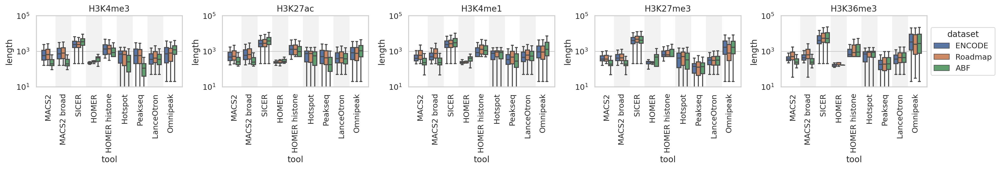

In [47]:
sns.set_theme(style="whitegrid")
plt.figure(figsize=(20, 3.5))
axs = [plt.subplot(1, 5, i + 1) for i in range(5)]
for i, m in enumerate(MODIFICATIONS):
    print(m)
    ax = axs[i]
    sns.boxplot(data=df_lens[df_lens['modification'] == m], x='tool', y='length', hue='dataset',
                showfliers=False,
                order=TOOLS,
                hue_order=['ENCODE', 'Roadmap', 'ABF'],
                ax=ax)
    ax.title.set_text(m)

    if i < len(axs) - 1:
        ax.legend().set_visible(False)
    else:
        sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))
    if m not in ['H3K36me3']:
        ax.set_ylim(bottom=10, top=1e5)
    else:
        ax.set_ylim(bottom=10, top=1e5)
    ax.set(yscale='log')
    ax.xaxis.set_tick_params(rotation=90)
    # Add light-grey bands for odd categories
    for k in range(len(ax.get_xticks())):
        if k % 2:  # odd
            ax.axvspan(k - 0.5, k + 0.5, zorder=0, color="0.95")

plt.tight_layout()
plt.show()

# Average length

In [35]:
def compute_avg_lens(df):
    ts = []
    for (ds, m, c, r, tool), dft in df[
        ['dataset', 'modification', 'cell', 'replicate', 'tool', 'length', 'footprint']
    ].groupby(['dataset', 'modification', 'cell', 'replicate', 'tool']):
        dft.sort_values(by=['length'], inplace=True)
        ts.append(dft.iloc[int(len(dft) * 0.1): int(len(dft) * 0.9)])
    ts = pd.concat(ts).reset_index(drop=True)
    df_lens_avg = ts.groupby(['dataset', 'modification', 'cell', 'replicate', 'tool']).agg('mean').reset_index()
    df_lens_avg['ds_c_r'] = df_lens_avg['dataset'] + ' ' + df_lens_avg['cell'] + ' ' + df_lens_avg['replicate']
    return df_lens_avg

In [36]:
df_lens_avg = compute_avg_lens(df_lens)
df_lens_avg.sample(3)

,dataset,modification,cell,replicate,tool,length,footprint,ds_c_r
923,ABF,H3K4me1,OD,OD12,MACS2 broad,272.10750,103137738.0,ABF OD OD12
133,ABF,H3K27ac,OD,OD4,Peakseq,548.74975,42639743.0,ABF OD OD4
2320,Roadmap,H3K4me3,CD4ABT,rep1,MACS2 broad,1241.21825,36449729.0,Roadmap CD4ABT rep1


H3K4me3
H3K27ac
H3K4me1
H3K27me3
H3K36me3


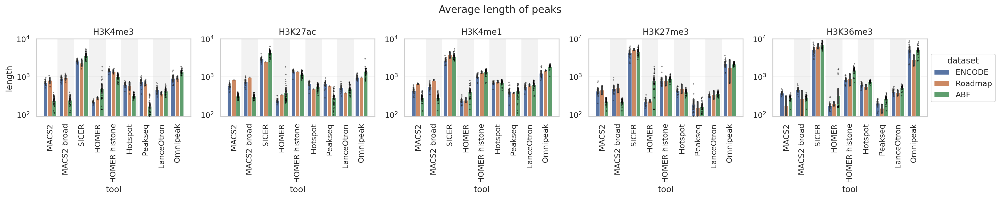

In [48]:
sns.set_theme(style="whitegrid")
fig = plt.figure(figsize=(20, 4))
fig.suptitle("Average length of peaks", fontsize="large")
axs = [plt.subplot(1, 5, i + 1) for i in range(5)]
for i, m in enumerate(MODIFICATIONS):
    print(m)
    ax = axs[i]
    sns.barplot(data=df_lens_avg[df_lens_avg['modification'] == m], x='tool', y='length', hue='dataset',
                order=TOOLS,
                hue_order=['ENCODE', 'Roadmap', 'ABF'],
                ax=ax)
    sns.stripplot(data=df_lens_avg[df_lens_avg['modification'] == m], x='tool', y='length', hue='dataset',
                  dodge=True, size=2, palette='dark:black', alpha=0.5, legend=False,
                  order=TOOLS,
                  hue_order=['ENCODE', 'Roadmap', 'ABF'],
                  ax=ax)
    ax.title.set_text(m)
    if i > 0:
        ax.set_ylabel(None)
    else:
        ax.set_ylabel('length')
    if i < len(axs) - 1:
        ax.legend().set_visible(False)
    else:
        sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))
    ax.set_ylim(bottom=90, top=1e4)
    ax.set(yscale='log')
    ax.xaxis.set_tick_params(rotation=90)
    # Add light-grey bands for odd categories
    for k in range(len(ax.get_xticks())):
        if k % 2:  # odd
            ax.axvspan(k - 0.5, k + 0.5, zorder=0, color="0.95")

plt.tight_layout()
plt.show()

H3K4me3
H3K27ac
H3K4me1
H3K27me3
H3K36me3


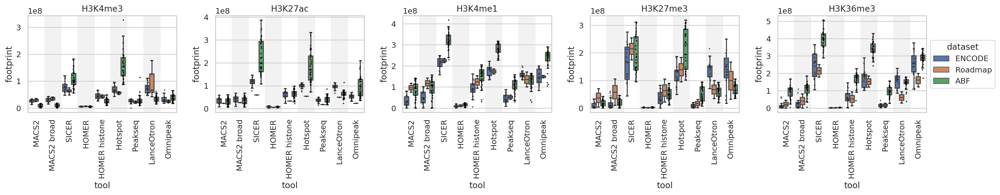

In [50]:
plt.figure(figsize=(20, 4))
axs = [plt.subplot(1, 5, i + 1) for i in range(5)]
for i, m in enumerate(MODIFICATIONS):
    print(m)
    ax = axs[i]
    sns.boxplot(data=df_lens_avg[df_lens_avg['modification'] == m], x='tool', y='footprint', hue='dataset',
                showfliers=False,
                order=TOOLS,
                hue_order=['ENCODE', 'Roadmap', 'ABF'],
                ax=ax)
    sns.stripplot(data=df_lens_avg[df_lens_avg['modification'] == m], x='tool', y='footprint', hue='dataset',
                  dodge=True, size=2, palette='dark:black', alpha=0.8, legend=False,
                  order=TOOLS,
                  hue_order=['ENCODE', 'Roadmap', 'ABF'],
                  ax=ax)
    ax.title.set_text(m)

    if i < len(axs) - 1:
        ax.legend().set_visible(False)
    else:
        sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))
    ax.xaxis.set_tick_params(rotation=90)
    # Add light-grey bands for odd categories
    for k in range(len(ax.get_xticks())):
        if k % 2:  # odd
            ax.axvspan(k - 0.5, k + 0.5, zorder=0, color="0.95")

plt.tight_layout()
plt.show()

# Peaks vs average length

All datasets


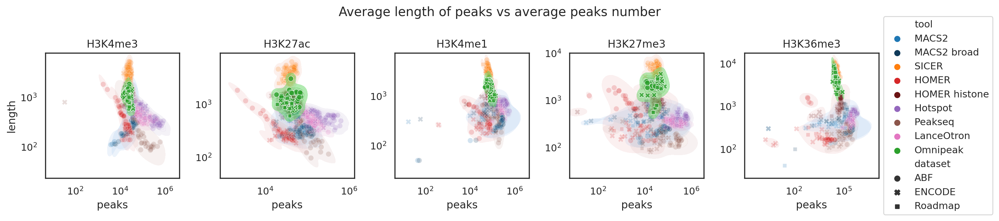

In [24]:
print('All datasets')
sns.set_theme(style="white")
t = pd.merge(df_lens_avg[['dataset', 'modification', 'cell', 'replicate', 'tool', 'length']],
             df_peaks[['dataset', 'modification', 'cell', 'replicate', 'tool', 'peaks']],
             on=['dataset', 'modification', 'cell', 'replicate', 'tool'])

fig = plt.figure(figsize=(16, 3.5))
fig.suptitle("Average length of peaks vs average peaks number", fontsize="large")
axs = [plt.subplot(1, 5, i + 1) for i in range(5)]
for i, m in enumerate(MODIFICATIONS):
    ax = axs[i]
    tm = t[(t['modification'] == m)]
    sns.kdeplot(
        tm[tm['tool'] != 'Omnipeak'], x='peaks', y='length', hue='tool',
        alpha=0.2,
        palette=TOOLS_PALETTE,
        hue_order=TOOLS,
        thresh=0.01,
        log_scale=True,
        fill=True,
        legend=False,
        ax=ax)
    sns.scatterplot(tm[tm['tool'] != 'Omnipeak'],
                    palette=TOOLS_PALETTE,
                    hue_order=TOOLS,
                    style='dataset',
                    x='peaks', y='length', hue='tool', alpha=0.2,
                    legend=False,
                    ax=ax)
    sns.kdeplot(
        tm[tm['tool'] == 'Omnipeak'], x='peaks', y='length', hue='tool',
        alpha=0.5,
        palette=TOOLS_PALETTE,
        hue_order=TOOLS,
        thresh=0.01,
        log_scale=True,
        fill=True,
        legend=False,
        ax=ax)
    sns.scatterplot(tm[tm['tool'] == 'Omnipeak'],
                    palette=TOOLS_PALETTE,
                    hue_order=TOOLS,
                    style='dataset',
                    x='peaks', y='length', hue='tool', alpha=0.8,
                    ax=ax)

    ax.set_title(m)
    if i > 0:
        ax.set_ylabel(None)
    if i < len(axs) - 1:
        ax.legend().set_visible(False)
    else:
        # Put a legend to the right of the current axis
        ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax.set(xscale='log')
    ax.set(yscale='log')
plt.tight_layout()
plt.show()
sns.set_theme(style="whitegrid")

# Distance between peaks

In [25]:
print('Load distances')
ts = []
for dataset, mod, cell, rep, file, tool in tqdm(list(zip(
        df_peaks['dataset'], df_peaks['modification'], df_peaks['cell'], df_peaks['replicate'], df_peaks['file'],
        df_peaks['tool']
))):
    try:
        tf = pd.read_csv(file, sep='\t', header=None).sort_values(by=[0, 1, 2])
        tss = []
        for chr, tfc in tf.groupby(0):
            starts = tfc[1]
            ends = tfc[2]
            ends = np.roll(ends, 1)
            ds = starts - ends
            t = pd.DataFrame(dict(distance=ds))
            # Ignore first and last
            tss.append(t.iloc[1:min(1_000, len(t) - 1)])
        t = pd.concat(tss).reset_index(drop=True)
        t['dataset'] = dataset
        t['modification'] = mod
        t['cell'] = cell
        t['replicate'] = rep
        t['tool'] = tool
        ts.append(t)
    except:
        pass
df_distances = pd.concat(ts).reset_index(drop=True)
del ts, tss, t
df_distances.sample(10)

Load distances


  0%|          | 0/2610 [00:00<?, ?it/s]

,distance,dataset,modification,cell,replicate,tool
8977718,2819,ENCODE,H3K4me1,Huvec,rep2,HOMER histone
34780735,10370,ABF,H3K27me3,OD,OD6,Omnipeak
47200404,11022,ABF,H3K27me3,OD,OD20,Peakseq
17830003,2140,Roadmap,H3K27ac,NK,,Omnipeak
29842170,801,ABF,H3K4me1,OD,OD19,SICER
21321743,7622,Roadmap,H3K36me3,CD34,rep1,Peakseq
35857275,1733015,ABF,H3K4me1,YD,YD6,Omnipeak
8450769,63199,ENCODE,H3K4me1,K562,rep2,HOMER histone
8755481,3282,ENCODE,H3K27ac,NHEK,rep1,HOMER histone
45726904,6317,ABF,H3K27me3,OD,OD2,Hotspot


H3K4me3
H3K27ac
H3K4me1
H3K27me3
H3K36me3


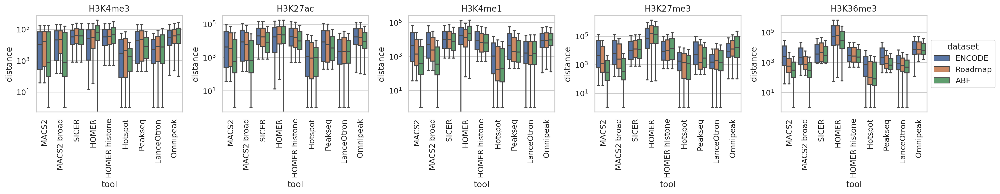

In [26]:
plt.figure(figsize=(20, 4))
axs = [plt.subplot(1, 5, i + 1) for i in range(5)]
for i, m in enumerate(MODIFICATIONS):
    print(m)
    ax = axs[i]
    sns.boxplot(data=df_distances[df_distances['modification'] == m],
                x='tool', y='distance', hue='dataset',
                showfliers=False,
                order=TOOLS,
                hue_order=['ENCODE', 'Roadmap', 'ABF'],
                ax=ax)
    ax.title.set_text(m)
    if i < len(axs) - 1:
        ax.legend().set_visible(False)
    else:
        sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))
    ax.set(yscale='log')
    ax.xaxis.set_tick_params(rotation=90)
    # Add light-grey bands for odd categories
    for k in range(len(ax.get_xticks())):
        if k % 2:  # odd
            ax.axvspan(k - 0.5, k + 0.5, zorder=0, color="0.9")

plt.tight_layout()
plt.show()

# Average distance

In [27]:
# Keep % of peaks, since outliers may significantly shift results
ts = []
for (ds, m, c, r, tool), dft in df_distances[
    ['dataset', 'modification', 'cell', 'replicate', 'tool', 'distance']
].groupby(['dataset', 'modification', 'cell', 'replicate', 'tool']):
    dft.sort_values(by=['distance'], inplace=True)
    ts.append(dft.iloc[int(len(dft) * 0.1): int(len(dft) * 0.9)])
    # ts.append(dft)
ts = pd.concat(ts).reset_index(drop=True)
df_distances_avg = ts.groupby(['dataset', 'modification', 'cell', 'replicate', 'tool']).agg('mean').reset_index()
df_distances_avg['ds_c_r'] = df_distances_avg['dataset'] + ' ' + df_distances_avg['cell'] + ' ' + df_distances_avg[
    'replicate']
df_distances_avg.sample(3)

,dataset,modification,cell,replicate,tool,distance,ds_c_r
1359,ABF,H3K4me3,YD,YD12,Hotspot,3632.509135,ABF YD YD12
118,ABF,H3K27ac,OD,OD3,HOMER histone,24292.847852,ABF OD OD3
1816,ENCODE,H3K36me3,H1,rep1,LanceOtron,3793.693082,ENCODE H1 rep1


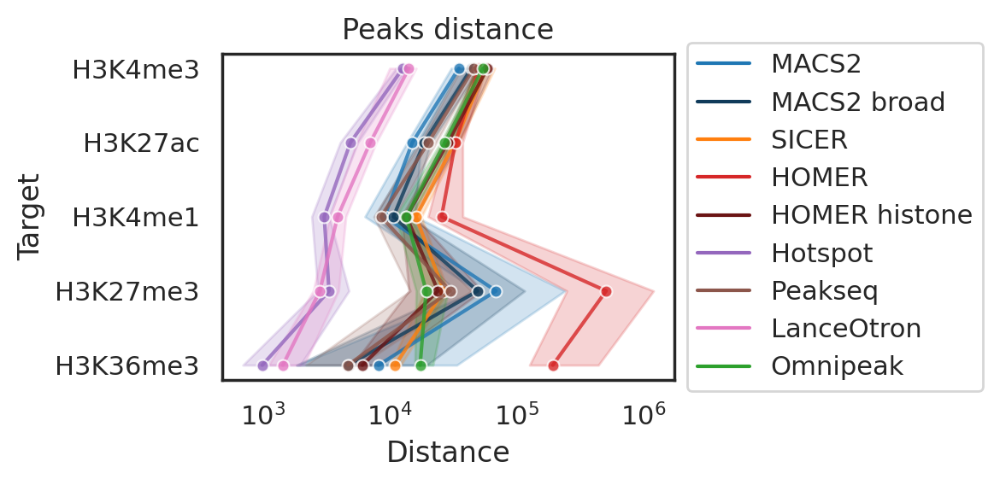

In [28]:
sns.set_theme(style="white")
df_lens['mindex'] = 0
for i, m in enumerate(reversed(MODIFICATIONS)):
    df_distances_avg.loc[df_distances_avg['modification'] == m, 'mindex'] = i
plt.figure(figsize=(6, 3))
t = df_distances_avg[df_distances_avg['dataset'].isin(['ENCODE', 'Roadmap', ])]
g_results = sns.lineplot(data=t.sort_values(by=['mindex', 'tool', 'distance']),
                         x='distance', y='mindex', hue='tool', orient='y', estimator='median',
                         alpha=0.8,
                         hue_order=TOOLS,
                         palette=TOOLS_PALETTE,
                         marker='o', markersize=5
                         )
g_results.axes.set_yticks(range(5), minor=False)
g_results.axes.set_yticklabels(reversed(MODIFICATIONS))
g_results.axes.set_ylabel('Target')
g_results.axes.set_xlabel('Distance')
g_results.set(xscale='log')
g_results.axes.title.set_text(f'Peaks distance')
g_results.axes.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()
sns.set_theme(style="whitegrid")

# Avg length vs distance

All datasets


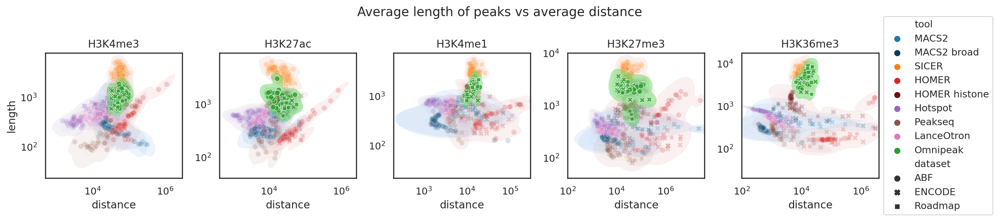

In [29]:
print('All datasets')
sns.set_theme(style="white")
t = pd.merge(df_lens_avg[['dataset', 'modification', 'cell', 'replicate', 'tool', 'length']],
             df_distances_avg[['dataset', 'modification', 'cell', 'replicate', 'tool', 'distance']],
             on=['dataset', 'modification', 'cell', 'replicate', 'tool'])

fig = plt.figure(figsize=(16, 3.5))
fig.suptitle("Average length of peaks vs average distance", fontsize="large")
axs = [plt.subplot(1, 5, i + 1) for i in range(5)]
for i, m in enumerate(MODIFICATIONS):
    ax = axs[i]
    tm = t[(t['modification'] == m)]
    sns.kdeplot(
        tm[tm['tool'] != 'Omnipeak'], x='distance', y='length', hue='tool',
        alpha=0.2,
        palette=TOOLS_PALETTE,
        hue_order=TOOLS,
        thresh=0.01,
        log_scale=True,
        fill=True,
        legend=False,
        ax=ax)
    sns.scatterplot(tm[tm['tool'] != 'Omnipeak'],
                    palette=TOOLS_PALETTE,
                    hue_order=TOOLS,
                    style='dataset',
                    x='distance', y='length', hue='tool', alpha=0.2,
                    legend=False,
                    ax=ax)
    sns.kdeplot(
        tm[tm['tool'] == 'Omnipeak'], x='distance', y='length', hue='tool',
        alpha=0.5,
        palette=TOOLS_PALETTE,
        hue_order=TOOLS,
        thresh=0.01,
        log_scale=True,
        fill=True,
        legend=False,
        ax=ax)
    sns.scatterplot(tm[tm['tool'] == 'Omnipeak'],
                    palette=TOOLS_PALETTE,
                    hue_order=TOOLS,
                    style='dataset',
                    x='distance', y='length', hue='tool', alpha=0.8,
                    ax=ax)

    ax.set_title(m)
    if i > 0:
        ax.set_ylabel(None)
    if i < len(axs) - 1:
        ax.legend().set_visible(False)
    else:
        # Put a legend to the right of the current axis
        ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax.set(xscale='log')
    ax.set(yscale='log')
    if m == 'H3K4me1':
        ax.set_xlim(2e2, 3e5)
    elif m == 'H3K27me3':
        ax.set_xlim(1e2, 4e7)
    elif m == 'H3K36me3':
        ax.set_xlim(1e2, 4e6)
plt.tight_layout()
plt.show()
sns.set_theme(style="whitegrid")

# ATAC-seq, CTCF info



In [30]:
def simple_load_peaks(path, suffix):
    df = pd.DataFrame(columns=['file', 'peaks'], dtype=object)
    for f in tqdm(os.listdir(path)):
        if not f.endswith(suffix):
            continue
        file = os.path.join(path, f)
        ps = lines(file)
        df.loc[len(df)] = (file, ps)
    return df


def simple_load_peaks_path(path):
    df_macs2 = simple_load_peaks(os.path.join(path, 'macs2'), '.narrowPeak')
    df_macs2['tool'] = 'MACS2'
    print('MACS2', len(df_macs2))

    df_macs2_broad = simple_load_peaks(os.path.join(path, 'macs2'), '.broadPeak')
    df_macs2_broad['tool'] = 'MACS2 broad'
    print('MACS2 broad', len(df_macs2_broad))

    df_sicer = simple_load_peaks(os.path.join(path, 'sicer'), '.scoreisland')
    if len(df_sicer) == 0:
        df_sicer = simple_load_peaks(os.path.join(path, 'sicer'), '-FDR0.01')
    df_sicer['tool'] = 'SICER'
    print('SICER', len(df_sicer))

    df_omnipeak = simple_load_peaks(os.path.join(path, 'omnipeak'), '.peak')
    df_omnipeak['tool'] = 'Omnipeak'
    print('Omnipeak', len(df_omnipeak))

    df_homer = simple_load_peaks(os.path.join(path, 'homer'), '_peaks.bed')
    df_homer['tool'] = 'HOMER'
    print('HOMER', len(df_homer))

    df_homer_histone = simple_load_peaks(os.path.join(path, 'homer'), '_regions.bed')
    df_homer_histone['tool'] = 'HOMER histone'
    print('HOMER histone', len(df_homer_histone))

    df_hotspot = simple_load_peaks(os.path.join(path, 'hotspot'), '.peak')
    df_hotspot['tool'] = 'Hotspot'
    print('Hotspot', len(df_hotspot))

    df_peakseq = simple_load_peaks(os.path.join(path, 'peakseq'), '.narrowPeak')
    df_peakseq['tool'] = 'Peakseq'
    print('Peakseq', len(df_peakseq))

    df_lanceotron = simple_load_peaks(os.path.join(path, 'lanceotron'), '.bed')
    df_lanceotron['tool'] = 'LanceOtron'
    print('LanceOtron', len(df_lanceotron))

    return pd.concat(
        [df_macs2, df_macs2_broad, df_sicer, df_omnipeak, df_homer, df_homer_histone, df_hotspot, df_peakseq,
         df_lanceotron]).reset_index(
        drop=True)

In [31]:
ATAC_PATH = os.path.expanduser('~/data/2024_Immgen')
dfa = simple_load_peaks_path(ATAC_PATH)
dfa

  0%|          | 0/1480 [00:00<?, ?it/s]

MACS2 185


  0%|          | 0/1480 [00:00<?, ?it/s]

MACS2 broad 185


  0%|          | 0/185 [00:00<?, ?it/s]

SICER 185


  0%|          | 0/370 [00:00<?, ?it/s]

Omnipeak 185


  0%|          | 0/370 [00:00<?, ?it/s]

HOMER 185


  0%|          | 0/370 [00:00<?, ?it/s]

HOMER histone 185


  0%|          | 0/185 [00:00<?, ?it/s]

Hotspot 185


0it [00:00, ?it/s]

Peakseq 0


  0%|          | 0/366 [00:00<?, ?it/s]

LanceOtron 183


,file,peaks,tool
0,/home/jetbrains/data/2024_Immgen/macs2/SRR5799...,17421,MACS2
1,/home/jetbrains/data/2024_Immgen/macs2/SRR5799...,64081,MACS2
2,/home/jetbrains/data/2024_Immgen/macs2/SRR5799...,21233,MACS2
3,/home/jetbrains/data/2024_Immgen/macs2/SRR5799...,29318,MACS2
4,/home/jetbrains/data/2024_Immgen/macs2/SRR5799...,37337,MACS2
...,...,...,...
1473,/home/jetbrains/data/2024_Immgen/lanceotron/SR...,281553,LanceOtron
1474,/home/jetbrains/data/2024_Immgen/lanceotron/SR...,238811,LanceOtron
1475,/home/jetbrains/data/2024_Immgen/lanceotron/SR...,250286,LanceOtron
1476,/home/jetbrains/data/2024_Immgen/lanceotron/SR...,261937,LanceOtron


In [32]:
ts = []
for tool, file in tqdm(zip(dfa['tool'], dfa['file'])):
    lengths = bedl(file)
    t = pd.DataFrame(dict(length=lengths))
    t.sort_values(by=['length'], inplace=True)
    t = t.sample(min(len(t), 10_000)).copy()
    t = t.iloc[: int(len(t) * 0.9)].copy()  # ATAC-seq may include large domains, skip them
    t['tool'] = tool
    t['file'] = file
    ts.append(t)
dfa_lens = pd.concat(ts).reset_index(drop=True)
dfa_lens['modification'] = 'ATAC'
dfa_lens['dataset'] = 'Immgen'
dfa_lens_avg = dfa_lens.groupby(['dataset', 'modification', 'tool', 'file']).agg('mean').reset_index()
del ts
display(dfa_lens_avg.sample(10))

0it [00:00, ?it/s]

,dataset,modification,tool,file,length
1198,Immgen,ATAC,Omnipeak,/home/jetbrains/data/2024_Immgen/omnipeak/SRR5...,486.760556
386,Immgen,ATAC,Hotspot,/home/jetbrains/data/2024_Immgen/hotspot/SRR57...,365.112000
998,Immgen,ATAC,MACS2 broad,/home/jetbrains/data/2024_Immgen/macs2/SRR5799...,207.797222
1049,Immgen,ATAC,MACS2 broad,/home/jetbrains/data/2024_Immgen/macs2/SRR5799...,236.658333
719,Immgen,ATAC,LanceOtron,/home/jetbrains/data/2024_Immgen/lanceotron/SR...,354.749556
1416,Immgen,ATAC,SICER,/home/jetbrains/data/2024_Immgen/sicer/SRR5799...,1576.555556
53,Immgen,ATAC,HOMER,/home/jetbrains/data/2024_Immgen/homer/SRR5799...,92.000000
213,Immgen,ATAC,HOMER histone,/home/jetbrains/data/2024_Immgen/homer/SRR5799...,835.395111
569,Immgen,ATAC,LanceOtron,/home/jetbrains/data/2024_Immgen/lanceotron/SR...,366.160556
626,Immgen,ATAC,LanceOtron,/home/jetbrains/data/2024_Immgen/lanceotron/SR...,317.085667


In [33]:
CTCF_PATH = os.path.expanduser('~/data/2024_TFs')
df_ctcf = simple_load_peaks_path(CTCF_PATH)
display(df_ctcf)

  0%|          | 0/74 [00:00<?, ?it/s]

MACS2 9


  0%|          | 0/74 [00:00<?, ?it/s]

MACS2 broad 11


  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

SICER 9


  0%|          | 0/18 [00:00<?, ?it/s]

Omnipeak 9


  0%|          | 0/18 [00:00<?, ?it/s]

HOMER 9


  0%|          | 0/18 [00:00<?, ?it/s]

HOMER histone 9


  0%|          | 0/9 [00:00<?, ?it/s]

Hotspot 9


  0%|          | 0/15 [00:00<?, ?it/s]

Peakseq 9


  0%|          | 0/18 [00:00<?, ?it/s]

LanceOtron 9


,file,peaks,tool
0,/home/jetbrains/data/2024_TFs/macs2/Monocyte_C...,24810,MACS2
1,/home/jetbrains/data/2024_TFs/macs2/GM12878_re...,50063,MACS2
2,/home/jetbrains/data/2024_TFs/macs2/H1_CTCF_EN...,61358,MACS2
3,/home/jetbrains/data/2024_TFs/macs2/NHLF_CTCF_...,18950,MACS2
4,/home/jetbrains/data/2024_TFs/macs2/BCell_CTCF...,30160,MACS2
...,...,...,...
78,/home/jetbrains/data/2024_TFs/lanceotron/K562_...,205646,LanceOtron
79,/home/jetbrains/data/2024_TFs/lanceotron/NK_CT...,35818,LanceOtron
80,/home/jetbrains/data/2024_TFs/lanceotron/Monoc...,284628,LanceOtron
81,/home/jetbrains/data/2024_TFs/lanceotron/HepG2...,134669,LanceOtron


In [34]:
ts = []
for tool, file in tqdm(zip(df_ctcf['tool'], df_ctcf['file'])):
    lengths = bedl(file)
    t = pd.DataFrame(dict(length=lengths))
    t = t.sample(min(len(t), 10_000)).copy()
    t['tool'] = tool
    t['file'] = file
    ts.append(t)
dfa_ctcf_lens = pd.concat(ts).reset_index(drop=True)
dfa_ctcf_lens['modification'] = 'CTCF'
dfa_ctcf_lens['dataset'] = 'CTCF'
dfa_ctcf_lens_avg = dfa_ctcf_lens.groupby(['dataset', 'modification', 'tool', 'file']).agg('mean').reset_index()
del ts
display(dfa_ctcf_lens_avg.sample(3))

0it [00:00, ?it/s]

,dataset,modification,tool,file,length
49,CTCF,CTCF,MACS2 broad,/home/jetbrains/data/2024_TFs/macs2/HepG2_rep1...,177.0134
80,CTCF,CTCF,SICER,/home/jetbrains/data/2024_TFs/sicer/NK_CTCF_EN...,2399.9200
63,CTCF,CTCF,Peakseq,/home/jetbrains/data/2024_TFs/peakseq/BCell_CT...,498.2238


In [35]:
from collections import Counter

# Keep % of peaks, since outliers may significantly shift results
tracks_per_dataset = 20
ds_counter = Counter()
ts = []
for (ds, m, tool), dft in pd.concat([df_lens_avg, dfa_ctcf_lens_avg, dfa_lens_avg]).groupby(
        ['dataset', 'modification', 'tool']):
    c = ds_counter[(ds, m, tool)]
    if c >= tracks_per_dataset:
        continue
    ds_counter[(ds, m, tool)] += (tracks_per_dataset - c)
    ts.append(dft.head(tracks_per_dataset - c))

df_lens_balanced_avg = pd.concat(ts).reset_index()
display(df_lens_balanced_avg.sample(3))
# ds_counter

,index,dataset,modification,cell,replicate,tool,length,footprint,ds_c_r,file
271,445,ABF,H3K27me3,OD,OD2,MACS2,272.960250,29526234.0,ABF OD OD2,NaN
1839,923,Immgen,ATAC,NaN,NaN,MACS2 broad,224.781444,NaN,NaN,/home/jetbrains/data/2024_Immgen/macs2/SRR5799...
864,1231,ABF,H3K4me3,OD,OD13,Peakseq,217.037625,20965195.0,ABF OD OD13,NaN


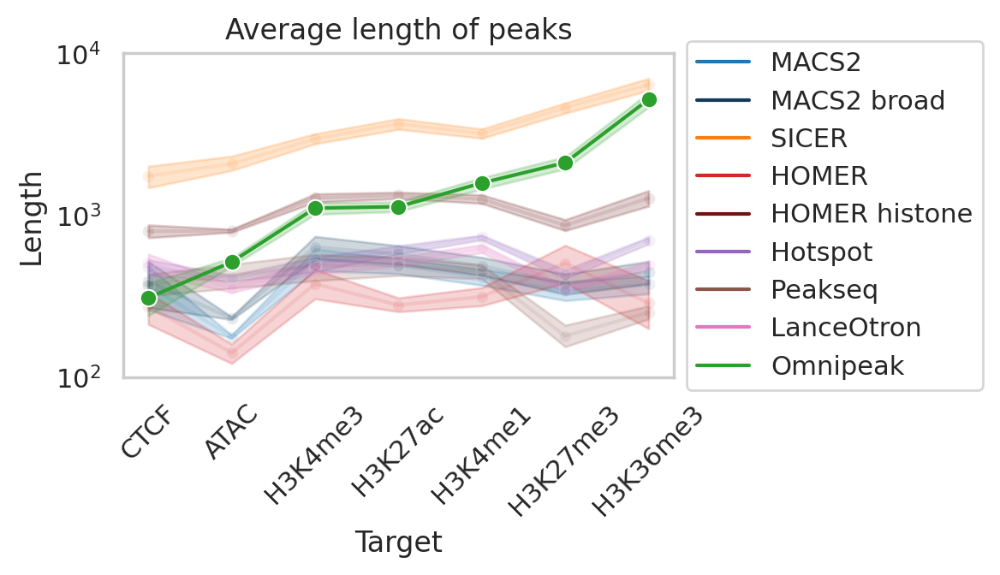

In [36]:
t = df_lens_balanced_avg.copy()

sns.set_theme(style="whitegrid")
t['mindex'] = 0
for i, m in enumerate(['CTCF', 'ATAC'] + MODIFICATIONS):
    t.loc[t['modification'] == m, 'mindex'] = i
t = t.sort_values(by=['mindex', 'tool', 'length'])
plt.figure(figsize=(6, 3.5))
ax = plt.axes()
sns.lineplot(data=t[t['tool'] != 'Omnipeak'],
             y='length', x='mindex', hue='tool', orient='x',
             alpha=0.1,
             hue_order=TOOLS,
             palette=TOOLS_PALETTE,
             marker='o', markersize=5,
             legend=False,
             ax=ax)
sns.lineplot(data=t[t['tool'] == 'Omnipeak'],
             y='length', x='mindex', hue='tool', orient='x',
             alpha=1.0,
             hue_order=TOOLS,
             palette=TOOLS_PALETTE,
             marker='o', markersize=7,
             legend=True,
             ax=ax)
ax.set_xticks(range(7), minor=False)
ax.set_xticklabels(['CTCF', 'ATAC'] + MODIFICATIONS)
ax.set_xlabel('Target')
ax.set_ylabel('Length')
ax.set(yscale='log')
ax.set_ylim(100, 1.0e4)
ax.title.set_text('Average length of peaks')
ax.xaxis.set_tick_params(rotation=45)
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
# Hide grid lines
ax.grid(False)
plt.tight_layout()
plt.show()

# BAMs

In [35]:
def load_bams(path, modifications, cells, replicates, control='Input'):
    df_bams = pd.DataFrame(columns=['bam_file', 'modification', 'cell', 'replicate', 'reads'], dtype=object)
    for f in tqdm(os.listdir(path)):
        if not f.endswith('.bam'):
            continue
        cell = next((c for c in cells if c in f), None)
        rep = next((r for r in replicates if r in f), None)
        mod = next((m for m in modifications if m in f), None)
        if mod is None and control is not None and control in f:
            mod = 'Control'
        if mod and cell is not None and rep is not None:
            file = os.path.join(path, f)
            reads = ! samtools view -F 0x04 -c {file}
            reads = int(reads[0])
            df_bams.loc[len(df_bams)] = (file, mod, cell, rep, reads)
    return df_bams

In [36]:
df_encode_bams = load_bams(GSE26320_PATH + '/bams', MODIFICATIONS, GSE26320_CELLS, GSE26320_REPS, 'Input')
df_encode_bams['dataset'] = 'ENCODE'

df_immune_bams = load_bams(IMMUNE_PATH + '/bams', MODIFICATIONS, IMMUNE_CELLS, IMMUNE_REPS, 'Control')
df_immune_bams['dataset'] = 'Roadmap'

  0%|          | 0/206 [00:00<?, ?it/s]

  0%|          | 0/112 [00:00<?, ?it/s]

In [37]:
df_abf_bams = load_bams(ABF_PATH + '/bams', ABF_MODIFICATIONS, [''], ABF_REPLICATES, 'input')
update_abf_modifications(df_abf_bams)
df_abf_bams['dataset'] = 'ABF'
reads = ! samtools view -F 0x04 -c {ABF_PATH}/bams/input.bam
reads = int(reads[0])
df_abf_bams.loc[len(df_abf_bams)] = (f'{ABF_PATH}/bams/input.bam', 'Control', '', '', reads, 'ABF')

  0%|          | 0/384 [00:00<?, ?it/s]

In [38]:
def simple_load_bams(path):
    df_bams = pd.DataFrame(columns=['bam_file', 'reads'], dtype=object)
    for f in tqdm(os.listdir(path)):
        if not f.endswith('.bam'):
            continue
        file = os.path.join(path, f)
        reads = ! samtools view -F 0x04 -c {file}
        reads = int(reads[0])
        df_bams.loc[len(df_bams)] = (file, reads)
    return df_bams


In [39]:
ATAC_PATH = os.path.expanduser('~/data/2024_Immgen')
df_atac_reads = simple_load_bams(ATAC_PATH + '/bams')
df_atac_reads['dataset'] = 'Immgen'
df_atac_reads['modification'] = 'ATAC'
df_atac_reads.sample(3)

  0%|          | 0/370 [00:00<?, ?it/s]

,bam_file,reads,dataset,modification
60,/home/jetbrains/data/2024_Immgen/bams/SRR57994...,22453692,Immgen,ATAC
27,/home/jetbrains/data/2024_Immgen/bams/SRR57995...,16171612,Immgen,ATAC
126,/home/jetbrains/data/2024_Immgen/bams/SRR57994...,16408195,Immgen,ATAC


In [40]:
CTCF_PATH = os.path.expanduser('~/data/2024_TFs')
df_ctcf_reads = simple_load_bams(CTCF_PATH + '/bams')
df_ctcf_reads['dataset'] = 'ENCODE'
df_ctcf_reads['modification'] = 'CTCF'
df_ctcf_reads.sample(3)

  0%|          | 0/27 [00:00<?, ?it/s]

,bam_file,reads,dataset,modification
2,/home/jetbrains/data/2024_TFs/bams/GM12878_rep...,17112632,ENCODE,CTCF
11,/home/jetbrains/data/2024_TFs/bams/GM12878_Inp...,5699825,ENCODE,CTCF
17,/home/jetbrains/data/2024_TFs/bams/BCell_Contr...,29198392,ENCODE,CTCF


In [41]:
df_abf_bams['cell'] = ['OD' if r.startswith('OD') else 'YD' for r in df_abf_bams['replicate']]

In [42]:
df_bams_all = pd.concat([df_encode_bams, df_immune_bams, df_abf_bams, df_atac_reads, df_ctcf_reads]).reset_index(
    drop=True)
df_bams_all.sort_values(by=['dataset', 'modification'], inplace=True)

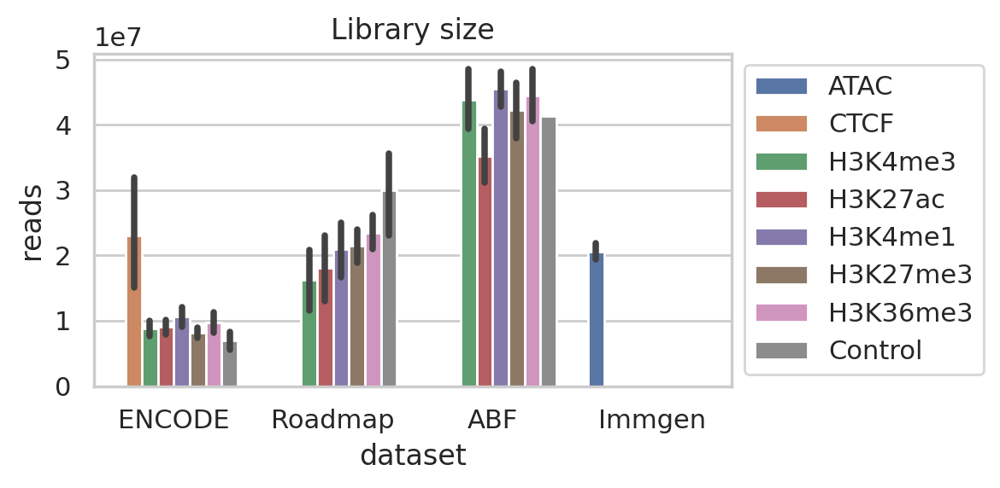

In [43]:
plt.figure(figsize=(6, 3))
ax = plt.axes()
sns.barplot(data=df_bams_all, hue='modification', x='dataset', y='reads',
            order=['ENCODE', 'Roadmap', 'ABF', 'Immgen'],
            # capsize=.05, err_kws={'linewidth': 2}, edgecolor="black",
            hue_order=['ATAC', 'CTCF'] + MODIFICATIONS + ['Control'],
            ax=ax)
ax.set_title('Library size')
# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.tight_layout()
plt.show()

In [44]:
def file_to_name(file):
    return re.sub('(.*SRR[0-9]+_)|(_ATAC_seq.*)', '', os.path.basename(file))


def file_to_srr(file):
    return re.sub('_.*', '', os.path.basename(file))


df_atac_reads['cell'] = [file_to_name(f) for f in df_atac_reads['bam_file']]
df_atac_reads['srr'] = [file_to_srr(f) for f in df_atac_reads['bam_file']]

In [45]:
df_counts = df_bams_all[df_bams_all['modification'] != 'Control'].groupby(
    ['dataset', 'modification']).size().reset_index(name='counts')
df_counts

,dataset,modification,counts
0,ABF,H3K27ac,40
1,ABF,H3K27me3,40
2,ABF,H3K36me3,39
3,ABF,H3K4me1,32
4,ABF,H3K4me3,40
5,ENCODE,CTCF,18
6,ENCODE,H3K27ac,17
7,ENCODE,H3K27me3,18
8,ENCODE,H3K36me3,17
9,ENCODE,H3K4me1,17


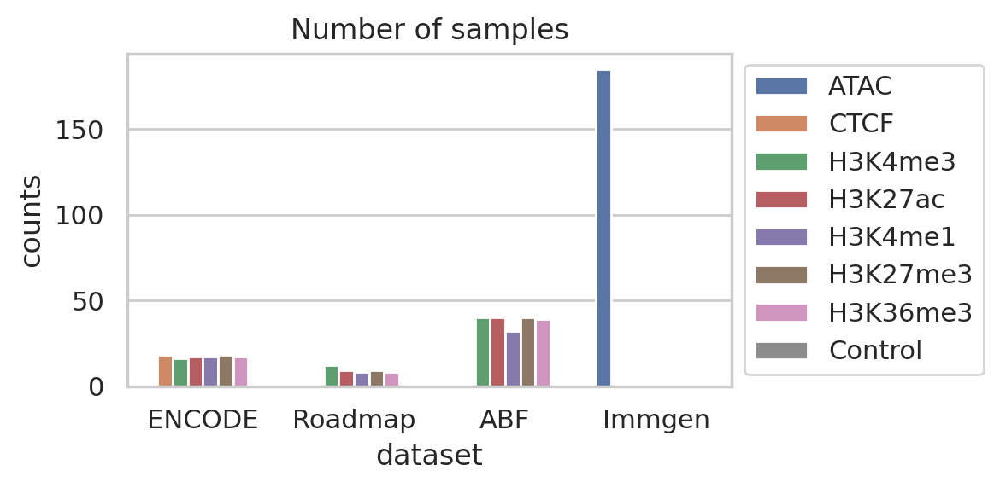

In [46]:
plt.figure(figsize=(6, 3))
ax = plt.axes()
sns.barplot(data=df_counts, hue='modification', x='dataset', y='counts',
            order=['ENCODE', 'Roadmap', 'ABF', 'Immgen'],
            hue_order=['ATAC', 'CTCF'] + MODIFICATIONS + ['Control'],
            ax=ax)
ax.set_title('Number of samples')
# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.tight_layout()
plt.show()

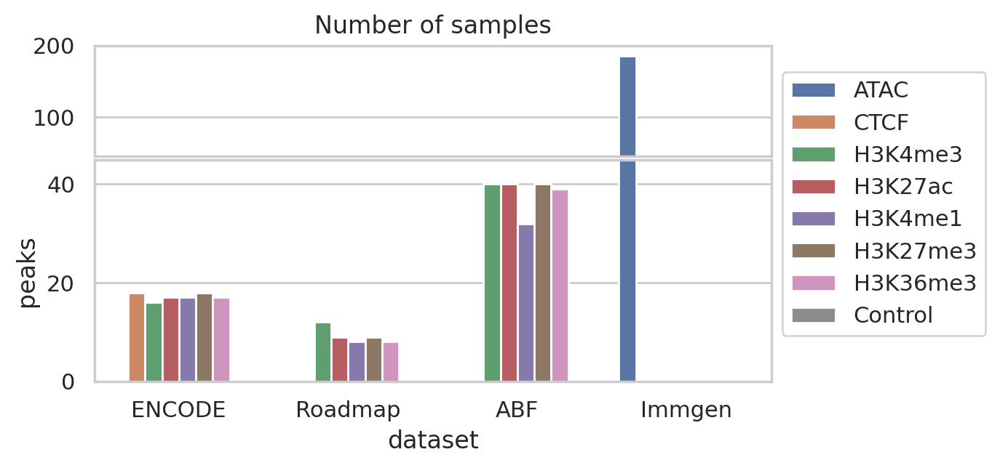

In [47]:
# Set up the matplotlib figure with broken y-axis
f, (axt, ax) = plt.subplots(2, 1, sharex=True, figsize=(6, 3),
                            gridspec_kw={'height_ratios': [1, 2]})
for axes in [ax, axt]:
    sns.barplot(data=df_counts, hue='modification', x='dataset', y='counts',
                order=['ENCODE', 'Roadmap', 'ABF', 'Immgen'],
                hue_order=['ATAC', 'CTCF'] + MODIFICATIONS + ['Control'],
                ax=axes)
ax.set_ylim(bottom=0, top=45)
axt.set_ylim(bottom=45, top=200)
axt.set_xlabel(None)
axt.set_ylabel(None)
axt.title.set_text('Number of samples')
ax.set_ylabel('peaks')
axt.legend().set_visible(False)
# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.8))
# plt.tight_layout()
plt.subplots_adjust(hspace=0.02)  # Adjust hspace closer to zero to remove spacing
plt.show()

In [48]:
df_replicates_counts = df_bams_all[df_bams_all['modification'] != 'Control'].groupby(
    ['dataset', 'modification', 'cell']).size().reset_index(name='replicates')
df_replicates_counts

,dataset,modification,cell,replicates
0,ABF,H3K27ac,OD,20
1,ABF,H3K27ac,YD,20
2,ABF,H3K27me3,OD,20
3,ABF,H3K27me3,YD,20
4,ABF,H3K36me3,OD,20
...,...,...,...,...
85,Roadmap,H3K4me3,Monocyte,1
86,Roadmap,H3K4me3,NK,1
87,Roadmap,H3K4me3,PBMC,1
88,Roadmap,H3K4me3,TCell,1


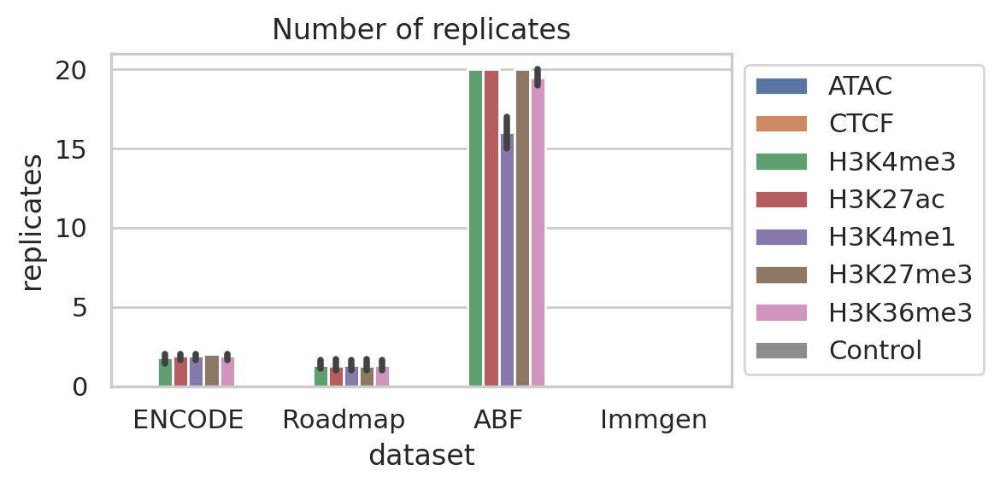

In [49]:
plt.figure(figsize=(6, 3))
ax = plt.axes()
sns.barplot(data=df_replicates_counts, hue='modification', x='dataset', y='replicates',
            order=['ENCODE', 'Roadmap', 'ABF', 'Immgen'],
            hue_order=['ATAC', 'CTCF'] + MODIFICATIONS + ['Control'],
            ax=ax)
ax.set_title('Number of replicates')
# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.tight_layout()
plt.show()

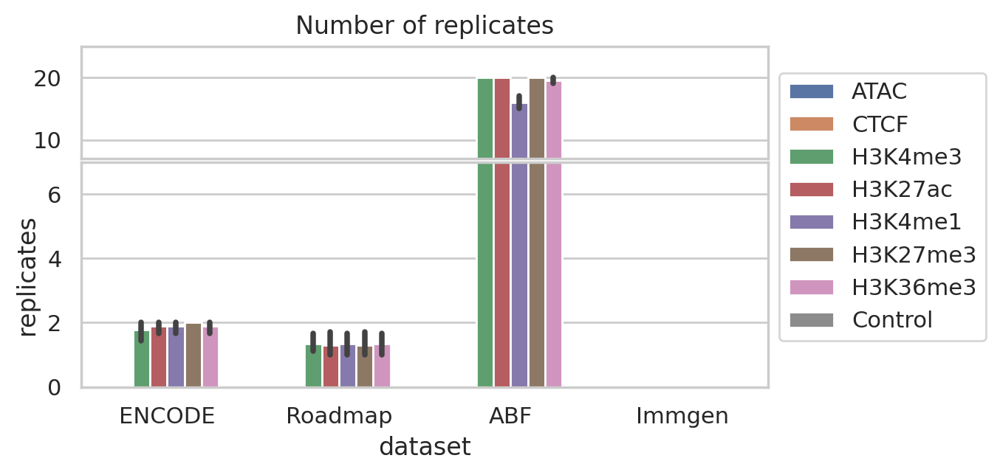

In [50]:
# Set up the matplotlib figure with broken y-axis
f, (axt, ax) = plt.subplots(2, 1, sharex=True, figsize=(6, 3),
                            gridspec_kw={'height_ratios': [1, 2]})
for axes in [ax, axt]:
    sns.barplot(data=df_replicates_counts, hue='modification', x='dataset', y='replicates',
                order=['ENCODE', 'Roadmap', 'ABF', 'Immgen'],
                hue_order=['ATAC', 'CTCF'] + MODIFICATIONS + ['Control'],
                ax=axes)
ax.set_ylim(bottom=0, top=7)
axt.set_ylim(bottom=7, top=25)
axt.set_xlabel(None)
axt.set_ylabel(None)
axt.title.set_text('Number of replicates')
ax.set_ylabel('replicates')
axt.legend().set_visible(False)
# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.8))
# plt.tight_layout()
plt.subplots_adjust(hspace=0.02)  # Adjust hspace closer to zero to remove spacing
plt.show()

# Reads vs peaks

In [51]:
df_peaks_bams = pd.merge(df_peaks[['dataset', 'modification', 'cell', 'replicate', 'tool', 'peaks']],
                         df_bams_all[['dataset', 'modification', 'cell', 'replicate', 'reads']],
                         on=['dataset', 'modification', 'cell', 'replicate'], how='inner')
df_peaks_bams.sample(3)

,dataset,modification,cell,replicate,tool,peaks,reads
2189,ABF,H3K4me3,OD,OD8,SICER,22713,49464493
1911,ABF,H3K27me3,OD,OD1,HOMER histone,48125,42887506
1951,ABF,H3K27me3,OD,OD1,LanceOtron,151249,50641542


/home/jetbrains/miniconda3/envs/pubtrends/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/jetbrains/miniconda3/envs/pubtrends/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


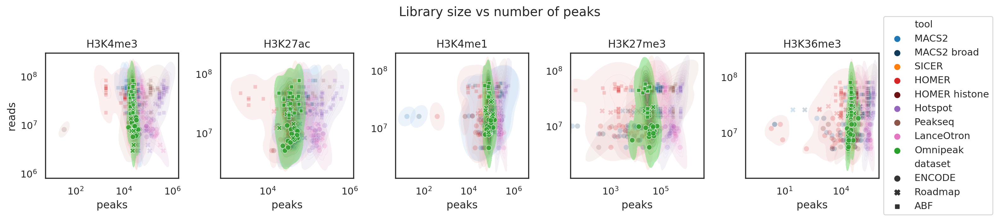

In [100]:
sns.set_theme(style="white")
fig = plt.figure(figsize=(16, 3.5))
fig.suptitle("Library size vs number of peaks", fontsize="large")
axs = [plt.subplot(1, 5, i + 1) for i in range(5)]
for i, m in enumerate(MODIFICATIONS):
    ax = axs[i]
    tm = df_peaks_bams[df_peaks_bams['modification'] == m]
    sns.kdeplot(
        tm[tm['tool'] != 'Omnipeak'], x='peaks', y='reads', hue='tool',
        alpha=0.2,
        palette=TOOLS_PALETTE,
        hue_order=TOOLS,
        thresh=0.01,
        log_scale=True,
        fill=True,
        legend=False,
        warn_singular=False,
        ax=ax)
    sns.scatterplot(tm[tm['tool'] != 'Omnipeak'],
                    palette=TOOLS_PALETTE,
                    hue_order=TOOLS,
                    style='dataset',
                    x='peaks', y='reads', hue='tool', alpha=0.2,
                    legend=False,
                    ax=ax)
    sns.kdeplot(
        tm[tm['tool'] == 'Omnipeak'], x='peaks', y='reads', hue='tool',
        alpha=0.5,
        palette=TOOLS_PALETTE,
        hue_order=TOOLS,
        thresh=0.01,
        log_scale=True,
        fill=True,
        legend=False,
        warn_singular=False,
        ax=ax)
    sns.scatterplot(tm[tm['tool'] == 'Omnipeak'],
                    palette=TOOLS_PALETTE,
                    hue_order=TOOLS,
                    style='dataset',
                    x='peaks', y='reads', hue='tool', alpha=0.8,
                    ax=ax)

    ax.set_title(m)
    if i > 0:
        ax.set_ylabel(None)
    if i < len(axs) - 1:
        ax.legend().set_visible(False)
    else:
        # Put a legend to the right of the current axis
        ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax.set(xscale='log')
    ax.set(yscale='log')
plt.tight_layout()
plt.show()
sns.set_theme(style="whitegrid")

# Difference

In [53]:
def compute_diffs(df):
    rows = []
    for (m, c, r), tmcr in tqdm(list(df.groupby(['modification', 'cell', 'replicate']))):
        print(m, c, r)
        t = tmcr[tmcr['tool'] == 'Omnipeak']
        if len(t) == 0:
            continue
        omnipeak_file, omnipeak_peaks, _ = load(sorted_file3(t['file'].values[0]))
        # Processing single tools information
        for tool in TOOLS:
            if tool == 'Omnipeak':
                continue
            t = tmcr[tmcr['tool'] == tool]
            if len(t) == 0:
                continue
            peaks_file, peaks, _ = load(sorted_file3(t['file'].values[0]))
            if omnipeak_peaks == 0:
                rows.append((m, c, r, f'Omnipeak - {tool}', 0))
                rows.append((m, c, r, f'{tool} - Omnipeak', peaks))
            elif peaks == 0:
                rows.append((m, c, r, f'Omnipeak - {tool}', omnipeak_peaks))
                rows.append((m, c, r, f'{tool} - Omnipeak', 0))
            else:
                rows.append((m, c, r, f'Omnipeak - {tool}', len(omnipeak_file.overlap(peaks_file, invert=True))))
                rows.append((m, c, r, f'{tool} - Omnipeak', len(peaks_file.overlap(omnipeak_file, invert=True))))
    return pd.DataFrame(rows, columns=['modification', 'cell', 'replicate', 'name', 'peaks'])

In [54]:
def plot_diff(df_peaks, df_diff):
    t = df_peaks[['modification', 'cell', 'replicate', 'tool', 'peaks']].copy()
    t.rename({'tool': 'name'}, axis=1, inplace=True)
    t = pd.concat([t, df_diff]).reset_index(drop=True)
    t = t.loc[
        [(m, c, r) not in OUTLIERS for _, (m, c, r) in t[['modification', 'cell', 'replicate']].iterrows()]].copy()

    plt.figure(figsize=(18, 5))
    axs = [plt.subplot(1, 5, i + 1) for i in range(5)]

    for i, m in enumerate(MODIFICATIONS):
        ax = axs[i]
        tm = t[t['modification'] == m]
        print(m, len(t))
        ax.set_title(m)
        sns.barplot(data=tm, x='name', y='peaks',
                    color='grey',
                    # capsize=.2, err_kws={'linewidth': 2},
                    order=[f'Omnipeak - {tool}' for tool in TOOLS if tool != 'Omnipeak'] +
                          [f'{tool} - Omnipeak' for tool in TOOLS if tool != 'Omnipeak'],
                    ax=ax)
        sns.stripplot(data=tm, x='name', y='peaks',
                      size=2, alpha=0.8, color='black',
                      order=[f'Omnipeak - {tool}' for tool in TOOLS if tool != 'Omnipeak'] +
                            [f'{tool} - Omnipeak' for tool in TOOLS if tool != 'Omnipeak'],
                      legend=False,
                      ax=ax)
        ax.set(yscale='log')
        ax.xaxis.set_tick_params(rotation=90)
        ax.set_ylabel('Peaks number')
    plt.tight_layout()
    plt.show()

## ENCODE

In [55]:
df_encode_diff_path = f'{GSE26320_PATH}/diff.tsv'
df_encode_diff = load_or_compute(df_encode_diff_path, lambda: compute_diffs(df_encode_peaks))
df_encode_diff.sample(5)

,modification,cell,replicate,name,peaks
1277,H3K4me3,Huvec,rep2,Peakseq - Omnipeak,23212
1237,H3K4me3,HepG2,rep2,SICER - Omnipeak,250
394,H3K27me3,HSMM,rep2,Omnipeak - Hotspot,1813
242,H3K27ac,NHLF,rep1,Omnipeak - MACS2 broad,24543
500,H3K27me3,NHEK,rep1,Omnipeak - SICER,9625


H3K4me3 2125
H3K27ac 2125
H3K4me1 2125
H3K27me3 2125
H3K36me3 2125


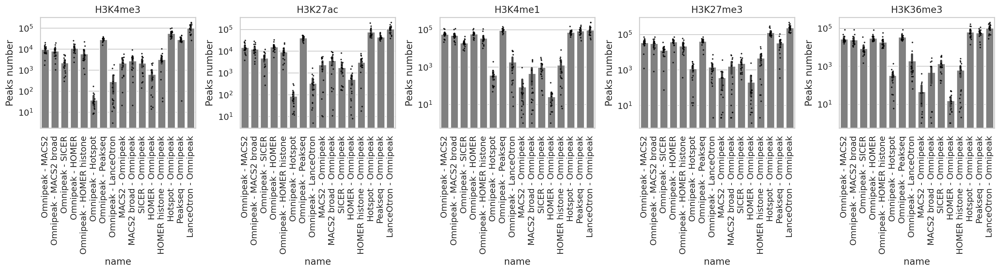

In [56]:
plot_diff(df_encode_peaks, df_encode_diff)

## Roadmap

In [57]:
df_immune_diff_path = f'{IMMUNE_PATH}/diff.tsv'
df_immune_diff = load_or_compute(df_immune_diff_path, lambda: compute_diffs(df_immune_peaks))
df_immune_diff.sample(5)

,modification,cell,replicate,name,peaks
457,H3K4me1,CD34,rep2,HOMER histone - Omnipeak,2863
619,H3K4me3,CD4ABT,rep1,Hotspot - Omnipeak,32206
516,H3K4me1,NK,NaN,Omnipeak - SICER,1912
38,H3K27ac,CD34,rep2,Omnipeak - HOMER,4425
226,H3K27me3,Monocyte,NaN,Omnipeak - MACS2 broad,23378


H3K4me3 1080
H3K27ac 1080
H3K4me1 1080
H3K27me3 1080
H3K36me3 1080


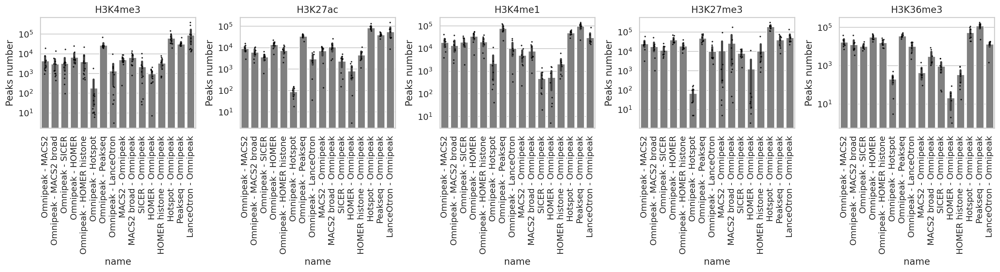

In [58]:
plot_diff(df_immune_peaks, df_immune_diff)

In [59]:
df_immune_diff[(df_immune_diff['modification'] == 'H3K27ac') &
               (df_immune_diff['name'] == 'MACS2 - Omnipeak')].sort_values(by=['peaks'], ascending=False).head(10)

,modification,cell,replicate,name,peaks
129,H3K27ac,TCell,NaN,MACS2 - Omnipeak,11212
49,H3K27ac,CD4,NaN,MACS2 - Omnipeak,10517
97,H3K27ac,NK,NaN,MACS2 - Omnipeak,9710
1,H3K27ac,BCell,NaN,MACS2 - Omnipeak,8873
81,H3K27ac,Monocyte,NaN,MACS2 - Omnipeak,8502
17,H3K27ac,CD34,NaN,MACS2 - Omnipeak,6964
33,H3K27ac,CD34,rep2,MACS2 - Omnipeak,3752
65,H3K27ac,CD4,rep1,MACS2 - Omnipeak,1854
113,H3K27ac,PBMC,NaN,MACS2 - Omnipeak,136


## ABF

In [60]:
df_abf_diff_path = f'{ABF_PATH}/diff.tsv'
df_abf_diff = load_or_compute(df_abf_diff_path, lambda: compute_diffs(df_abf_peaks))
df_abf_diff.sample(5)

,modification,cell,replicate,name,peaks
2288,H3K4me3,OD,OD20,Omnipeak - MACS2,9296
2128,H3K4me3,OD,OD10,Omnipeak - MACS2,8226
384,H3K27ac,YD,YD15,Omnipeak - MACS2,28308
1913,H3K4me1,YD,YD12,HOMER histone - Omnipeak,1739
156,H3K27ac,OD,OD18,Omnipeak - Peakseq,71352


H3K4me3 4125
H3K27ac 4125
H3K4me1 4125
H3K27me3 4125
H3K36me3 4125


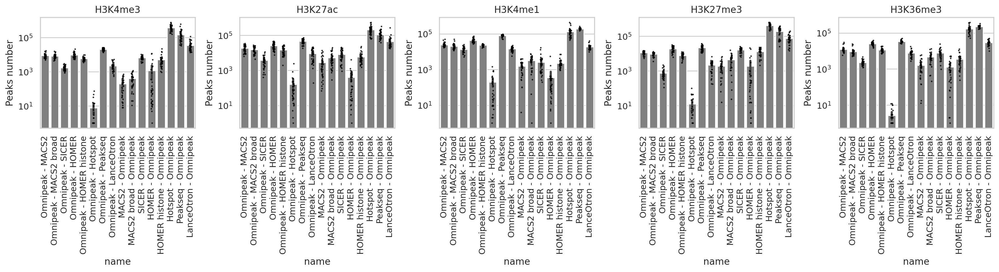

In [61]:
plot_diff(df_abf_peaks, df_abf_diff)

# Jaccard & Overlap

In [62]:
import pyranges as pr
import tempfile


def load(f):
    peaks = lines(f)
    if peaks == 0:
        return pr.PyRanges(), 0, 0
    else:
        prf = pr.read_bed(f)
        return prf, peaks, prf.lengths().sum()


def compute_reps_overlap(df_peaks):
    reps_overlap = pd.DataFrame(columns=['modification', 'cell', 'tool', 'rep1', 'rep2',
                                         'peaks1', 'peaks1_len', 'peaks2', 'peaks2_len',
                                         'peaks1_overlap', 'peaks2_overlap', 'peaks_overlap_len'], dtype=object)

    for (m, c, tool), tm in tqdm(df_peaks.groupby(['modification', 'cell', 'tool'])):
        reps = list(sorted(set(tm['replicate'])))
        print(m, c, tool, len(reps))
        if len(reps) < 2:
            continue
        files = [None] * len(reps)
        peaks = [0] * len(reps)
        peaks_lens = [0] * len(reps)

        print('Loading replicates...')
        for i in range(len(reps)):
            t1 = tm[(tm['tool'] == tool) & (tm['replicate'] == reps[i])]
            if len(t1) == 0:
                continue
            files[i], peaks[i], peaks_lens[i] = load(sorted_file3(t1['file'].values[0]))

        print('Computing Jaccard...')
        for i, j in product(range(len(reps)), range(len(reps))):
            if i >= j:
                continue
            rep1, rep2 = reps[i], reps[j]
            file1, file2 = files[i], files[j]
            peaks1, peaks2 = peaks[i], peaks[j]
            peaks1_len, peaks2_len = peaks_lens[i], peaks_lens[j]
            if peaks1 <= 0 or peaks2 <= 0:
                reps_overlap.loc[len(reps_overlap)] = \
                    (m, c, tool, rep1, rep2, peaks1, peaks1_len, peaks2, peaks2_len,
                     0, 0, 0)
                continue
            overlap1 = len(file1.overlap(file2))
            overlap2 = len(file2.overlap(file1))
            overlap_len = file1.intersect(file2).lengths().sum()
            reps_overlap.loc[len(reps_overlap)] = \
                (m, c, tool, rep1, rep2, peaks1, peaks1_len, peaks2, peaks2_len,
                 overlap1, overlap2, overlap_len)
    reps_overlap['jaccard'] = [
        d(lo, l1 + l2 - lo)
        for l1, l2, lo in zip(reps_overlap['peaks1_len'], reps_overlap['peaks2_len'], reps_overlap['peaks_overlap_len'])
    ]
    return reps_overlap

## Jaccard ENCODE 

In [63]:
t = df_encode_peaks.loc[[(m, c, r) not in OUTLIERS
                         for _, (m, c, r) in df_encode_peaks[['modification', 'cell', 'replicate']].iterrows()]]

df_encode_reps_path = GSE26320_PATH + '/overlap.tsv'
df_encode_reps = load_or_compute(df_encode_reps_path, lambda : compute_reps_overlap(t))


ENCODE


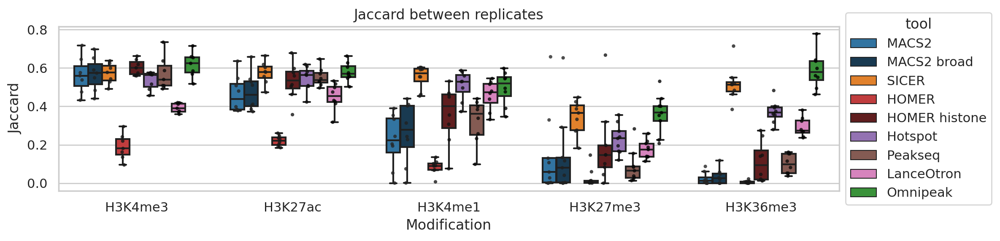

In [64]:
print('ENCODE')
plt.figure(figsize=(12, 3))
ax = plt.axes()
sns.boxplot(data=df_encode_reps, x='modification', hue='tool', y='jaccard',
            palette=TOOLS_PALETTE,
            order=MODIFICATIONS,
            hue_order=TOOLS,
            showfliers=False,
            ax=ax)
sns.stripplot(data=df_encode_reps, x='modification', hue='tool', y='jaccard',
              dodge=True, size=3, palette='dark:black', alpha=0.8,
              order=MODIFICATIONS,
              hue_order=TOOLS,
              legend=False,
              ax=ax)
ax.set_title('Jaccard between replicates')
ax.set_ylabel('Jaccard')
ax.set_xlabel('Modification')
sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

H3K4me3
H3K27ac
H3K4me1
H3K27me3
H3K36me3


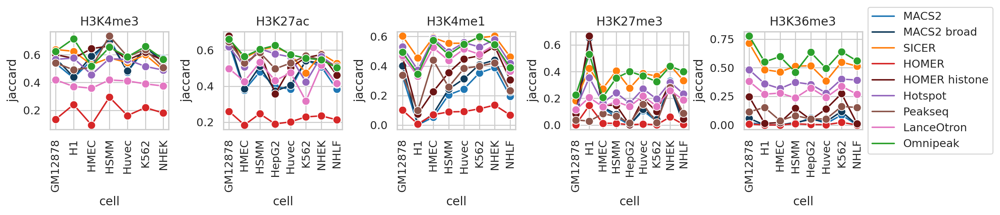

In [65]:
plt.figure(figsize=(14, 3))
axs = [plt.subplot(1, 5, i + 1) for i in range(5)]
for i, m in enumerate(MODIFICATIONS):
    print(m)
    ax = axs[i]
    g_results = sns.lineplot(data=df_encode_reps[df_encode_reps['modification'] == m],
                             x='cell', y='jaccard', hue='tool',
                             hue_order=TOOLS,
                             palette=TOOLS_PALETTE,
                             errorbar='se', marker='o', markersize=8,
                             ax=ax)
    g_results.axes.title.set_text(f'{m}')
    ax.set_title(m)
    if i != 4:
        ax.legend().set_visible(False)
    else:
        # Put a legend to the right of the current axis
        g_results.axes.legend(loc='center left', bbox_to_anchor=(1, 0.5))

    ax.xaxis.set_tick_params(rotation=90)

plt.tight_layout()
plt.show()

ENCODE


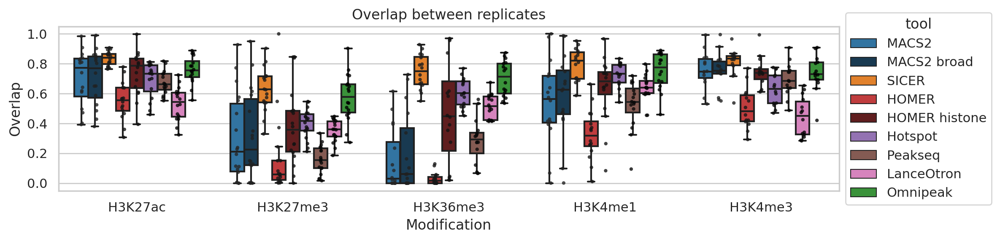

In [66]:
t = pd.concat([df_encode_reps[['modification', 'cell', 'tool']],
               df_encode_reps[['modification', 'cell', 'tool']]]).reset_index(drop=True)
overlaps = [d(o, p) for o, p in zip(df_encode_reps['peaks1_overlap'], df_encode_reps['peaks1'])] + \
           [d(o, p) for o, p in zip(df_encode_reps['peaks2_overlap'], df_encode_reps['peaks2'])]
t['overlap'] = overlaps
print('ENCODE')
plt.figure(figsize=(12, 3))
ax = plt.axes()
sns.boxplot(data=t, x='modification', hue='tool', y='overlap',
            palette=TOOLS_PALETTE,
            hue_order=TOOLS,
            showfliers=False
            )
sns.stripplot(data=t, x='modification', hue='tool', y='overlap',
              dodge=True, size=3, palette='dark:black', alpha=0.8,
              hue_order=TOOLS,
              legend=False,
              ax=ax)

ax.set_title('Overlap between replicates')
ax.set_ylabel('Overlap')
ax.set_xlabel('Modification')
sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

ENCODE
H3K4me3
H3K27ac
H3K4me1
H3K27me3
H3K36me3


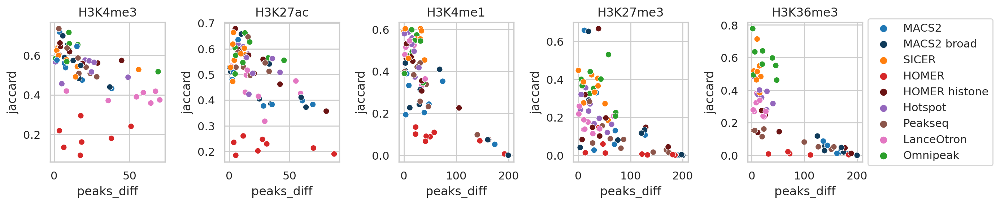

In [67]:
print('ENCODE')
df_encode_reps['peaks_diff'] = np.fabs((df_encode_reps['peaks1'] - df_encode_reps['peaks2']) /
                                       (df_encode_reps['peaks1'] + df_encode_reps['peaks2']) * 200)
plt.figure(figsize=(14, 3))
axs = [plt.subplot(1, 5, i + 1) for i in range(5)]
for i, m in enumerate(MODIFICATIONS):
    print(m)
    ax = axs[i]
    g_results = sns.scatterplot(data=df_encode_reps[df_encode_reps['modification'] == m],
                                x='peaks_diff', y='jaccard', hue='tool',
                                hue_order=TOOLS,
                                palette=TOOLS_PALETTE,
                                ax=ax)
    g_results.axes.title.set_text(f'{m}')
    ax.set_title(m)
    if i != 4:
        ax.legend().set_visible(False)
    else:
        # Put a legend to the right of the current axis
        g_results.axes.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.tight_layout()
plt.show()

ENCODE


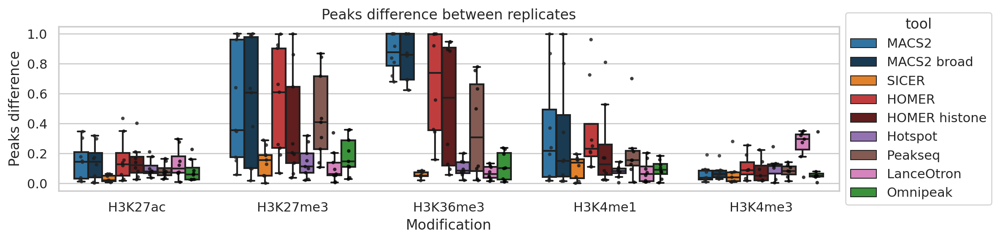

In [68]:
print('ENCODE')
df_encode_reps['reps_peaks_diff'] = np.fabs((df_encode_reps['peaks1'] - df_encode_reps['peaks2']) /
                                            (df_encode_reps['peaks1'] + df_encode_reps['peaks2']))

plt.figure(figsize=(12, 3))
ax = plt.axes()
sns.boxplot(data=df_encode_reps, x='modification', hue='tool', y='reps_peaks_diff',
            palette=TOOLS_PALETTE,
            hue_order=TOOLS,
            showfliers=False,
            ax=ax)
sns.stripplot(data=df_encode_reps, x='modification', hue='tool', y='reps_peaks_diff',
              dodge=True, size=3, palette='dark:black', alpha=0.8,
              hue_order=TOOLS, legend=False,
              ax=ax)
ax.set_title('Peaks difference between replicates')
ax.set_ylabel('Peaks difference')
ax.set_xlabel('Modification')
sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

In [69]:
rows = []
for _, (modification, tool, jaccard, p1, p2, l1, l2) in df_encode_reps[
    ['modification', 'tool', 'jaccard', 'peaks1', 'peaks2', 'peaks1_len', 'peaks2_len']].iterrows():
    rows.append((modification, tool, jaccard, d(l1, p1)))
    rows.append((modification, tool, jaccard, d(l2, p2)))
df_jaccard_avg_len_encode = pd.DataFrame(rows, columns=['modification', 'tool', 'jaccard', 'average_len'])
del rows

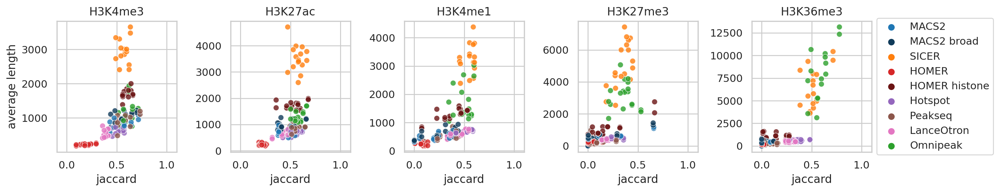

In [70]:
plt.figure(figsize=(15, 3))
axs = [plt.subplot(1, 5, i + 1) for i in range(5)]
for i, m in enumerate(MODIFICATIONS):
    ax = axs[i]
    sns.scatterplot(
        df_jaccard_avg_len_encode[df_jaccard_avg_len_encode['modification'] == m],
        palette=TOOLS_PALETTE,
        hue_order=TOOLS,
        x='jaccard', y='average_len', hue='tool', alpha=0.8,
        ax=ax,
    )
    ax.set_title(m)
    ax.set_xlim(-0.1, 1.1)
    ax.set_title(m)
    if i > 0:
        ax.set_ylabel(None)
    else:
        ax.set_ylabel('average length')
    if i < len(axs) - 1:
        ax.legend().set_visible(False)
    else:
        # Put a legend to the right of the current axis
        ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

H3K27ac


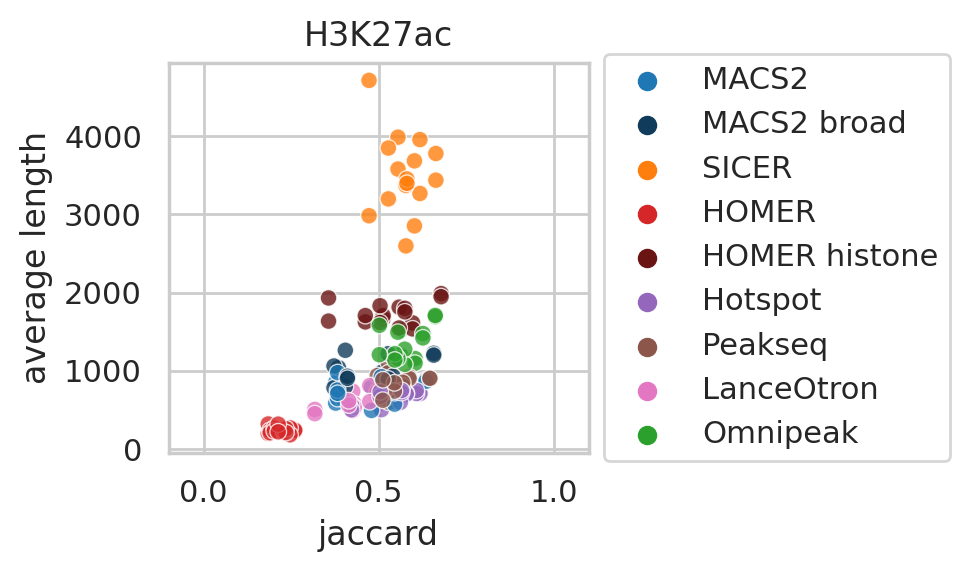

H3K4me1


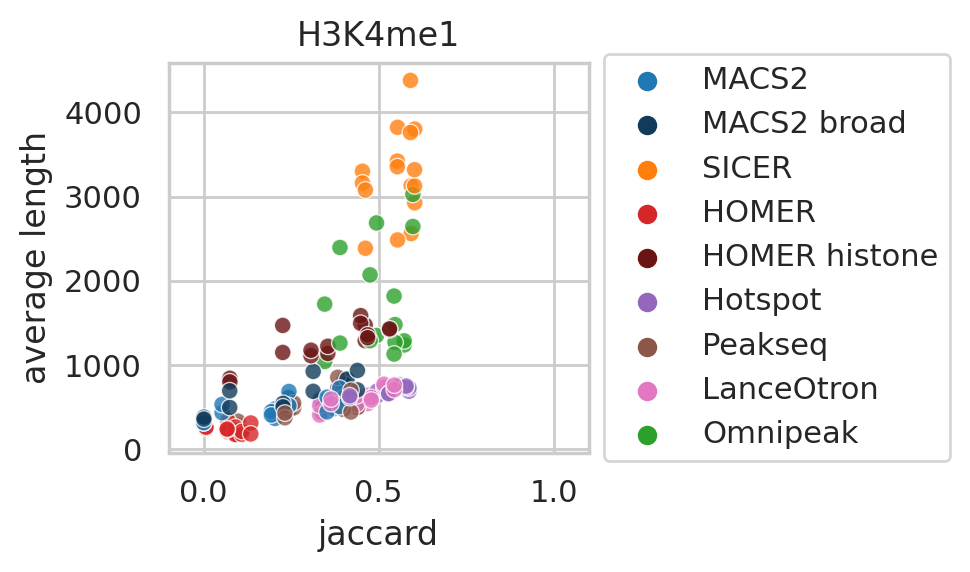

In [71]:
for m in ['H3K27ac', 'H3K4me1']:
    print(m)
    plt.figure(figsize=(5, 3))
    ax = plt.axes()
    sns.scatterplot(
        df_jaccard_avg_len_encode[df_jaccard_avg_len_encode['modification'] == m],
        palette=TOOLS_PALETTE,
        hue_order=TOOLS,
        x='jaccard', y='average_len', hue='tool', alpha=0.8,
        ax=ax,
        # fill=True
    )
    ax.set_title(m)
    ax.set_xlim(-0.1, 1.1)
    ax.set_title(m)
    ax.set_ylabel('average length')
    # Put a legend to the right of the current axis
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.tight_layout()
    plt.show()

## Jaccard Roadmap

In [72]:
t = df_immune_peaks.loc[[(m, c, r) not in OUTLIERS
                         for _, (m, c, r) in df_immune_peaks[['modification', 'cell', 'replicate']].iterrows()]]
# t = df_immune_peaks
df_immune_reps_path = IMMUNE_PATH + '/overlap.tsv'
df_immune_reps = load_or_compute(df_immune_reps_path, lambda : compute_reps_overlap(t))

Immune


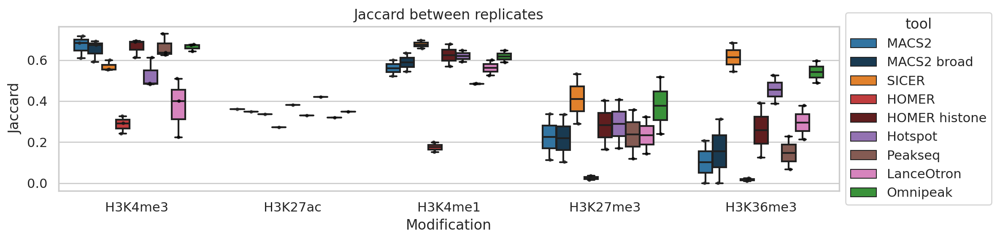

In [73]:
print('Immune')
plt.figure(figsize=(12, 3))
ax = plt.axes()
sns.boxplot(data=df_immune_reps, x='modification', hue='tool', y='jaccard',
            palette=TOOLS_PALETTE,
            order=MODIFICATIONS,
            hue_order=TOOLS,
            ax=ax)
sns.stripplot(data=df_immune_reps, x='modification', hue='tool', y='jaccard',
              dodge=True, size=3, palette='dark:black', alpha=0.8,
              order=MODIFICATIONS,
              hue_order=TOOLS,
              legend=False,
              ax=ax)
ax.set_title('Jaccard between replicates')
ax.set_ylabel('Jaccard')
ax.set_xlabel('Modification')
sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

H3K4me3
H3K27ac
H3K4me1
H3K27me3
H3K36me3


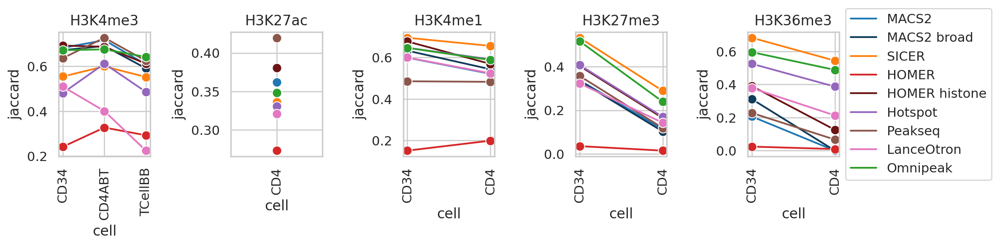

In [74]:
plt.figure(figsize=(12, 3))
axs = [plt.subplot(1, 5, i + 1) for i in range(5)]
for i, m in enumerate(MODIFICATIONS):
    print(m)
    ax = axs[i]
    g_results = sns.lineplot(data=df_immune_reps[df_immune_reps['modification'] == m],
                             x='cell', y='jaccard', hue='tool',
                             hue_order=TOOLS,
                             palette=TOOLS_PALETTE,
                             errorbar='se', marker='o', markersize=8,
                             ax=ax)
    g_results.axes.title.set_text(f'{m}')
    ax.set_title(m)
    if i != 4:
        ax.legend().set_visible(False)
    else:
        # Put a legend to the right of the current axis
        g_results.axes.legend(loc='center left', bbox_to_anchor=(1, 0.5))

    ax.xaxis.set_tick_params(rotation=90)

plt.tight_layout()
plt.show()

Immune


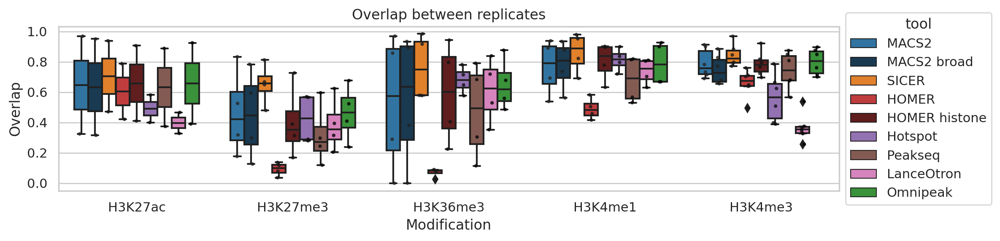

In [75]:
print('Immune')
t = pd.concat([df_immune_reps[['modification', 'cell', 'tool']],
               df_immune_reps[['modification', 'cell', 'tool']]]).reset_index(drop=True)
overlaps = [d(o, p) for o, p in zip(df_immune_reps['peaks1_overlap'], df_immune_reps['peaks1'])] + \
           [d(o, p) for o, p in zip(df_immune_reps['peaks2_overlap'], df_immune_reps['peaks2'])]
t['overlap'] = overlaps
plt.figure(figsize=(12, 3))
ax = plt.axes()
sns.boxplot(data=t, x='modification', hue='tool', y='overlap',
            palette=TOOLS_PALETTE,
            hue_order=TOOLS,
            ax=ax)
sns.stripplot(data=t, x='modification', hue='tool', y='overlap',
              dodge=True, size=3, palette='dark:black', alpha=0.8,
              hue_order=TOOLS,
              legend=False,
              ax=ax)

ax.set_title('Overlap between replicates')
ax.set_ylabel('Overlap')
ax.set_xlabel('Modification')
sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

H3K4me3
H3K27ac
H3K4me1
H3K27me3
H3K36me3


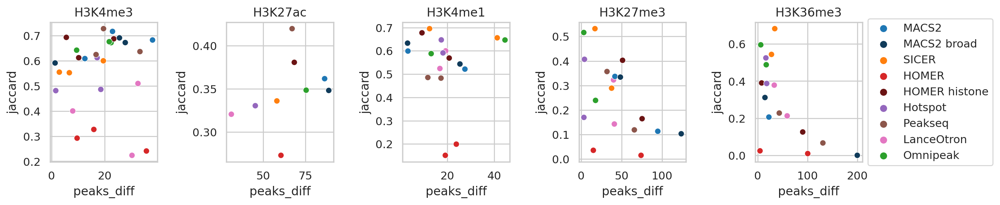

In [76]:
df_immune_reps['peaks_diff'] = np.fabs((df_immune_reps['peaks1'] - df_immune_reps['peaks2']) /
                                       (df_immune_reps['peaks1'] + df_immune_reps['peaks2']) * 200)

plt.figure(figsize=(14, 3))
axs = [plt.subplot(1, 5, i + 1) for i in range(5)]
for i, m in enumerate(MODIFICATIONS):
    print(m)
    ax = axs[i]
    g_results = sns.scatterplot(data=df_immune_reps[df_immune_reps['modification'] == m],
                                x='peaks_diff', y='jaccard', hue='tool',
                                hue_order=TOOLS,
                                palette=TOOLS_PALETTE,
                                ax=ax)
    g_results.axes.title.set_text(f'{m}')
    ax.set_title(m)
    if i != 4:
        ax.legend().set_visible(False)
    else:
        # Put a legend to the right of the current axis
        g_results.axes.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.tight_layout()
plt.show()

Immune


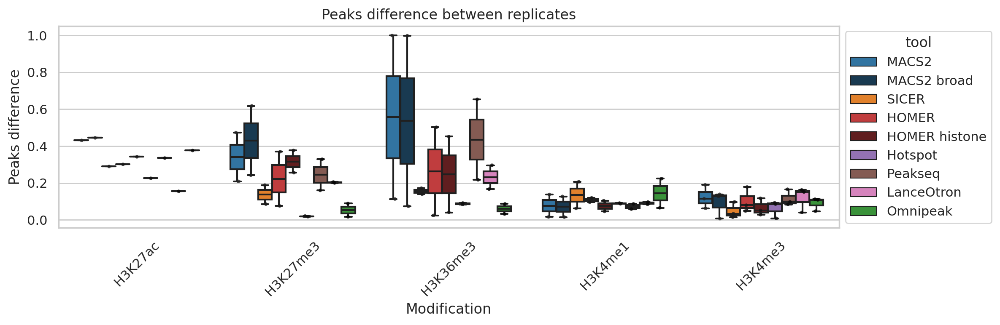

In [77]:
sns.set_style('whitegrid')
print('Immune')
df_immune_reps['peaks_diff'] = np.fabs((df_immune_reps['peaks1'] - df_immune_reps['peaks2']) /
                                       (df_immune_reps['peaks1'] + df_immune_reps['peaks2']))

plt.figure(figsize=(12, 4))
ax = plt.axes()
sns.boxplot(data=df_immune_reps, x='modification', hue='tool', y='peaks_diff',
            palette=TOOLS_PALETTE,
            hue_order=TOOLS,
            showfliers=False,
            ax=ax)
sns.stripplot(data=df_immune_reps, x='modification', hue='tool', y='peaks_diff',
              dodge=True, size=3, palette='dark:black', alpha=0.8,
              hue_order=TOOLS,
              legend=False,
              ax=ax)
ax.set_title('Peaks difference between replicates')
ax.set_ylabel('Peaks difference')
ax.set_xlabel('Modification')
ax.xaxis.set_tick_params(rotation=45)
sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

In [78]:
rows = []
for _, (modification, tool, jaccard, p1, p2, l1, l2) in df_immune_reps[
    ['modification', 'tool', 'jaccard', 'peaks1', 'peaks2', 'peaks1_len', 'peaks2_len']].iterrows():
    rows.append((modification, tool, jaccard, d(l1, p1)))
    rows.append((modification, tool, jaccard, d(l2, p2)))
df_jaccard_avg_len_immune = pd.DataFrame(rows, columns=['modification', 'tool', 'jaccard', 'average_len'])
del rows

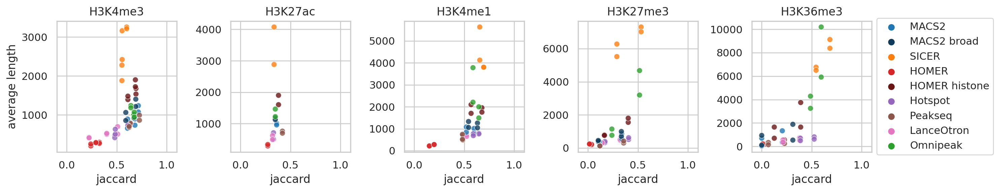

In [79]:
plt.figure(figsize=(15, 3))
axs = [plt.subplot(1, 5, i + 1) for i in range(5)]
for i, m in enumerate(MODIFICATIONS):
    ax = axs[i]
    sns.scatterplot(
        df_jaccard_avg_len_immune[df_jaccard_avg_len_immune['modification'] == m],
        palette=TOOLS_PALETTE,
        hue_order=TOOLS,
        x='jaccard', y='average_len', hue='tool', alpha=0.8,
        ax=ax,
    )
    ax.set_title(m)
    ax.set_xlim(-0.1, 1.1)
    ax.set_title(m)
    if i > 0:
        ax.set_ylabel(None)
    else:
        ax.set_ylabel('average length')
    if i < len(axs) - 1:
        ax.legend().set_visible(False)
    else:
        #     Put a legend to the right of the current axis
        ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

## All

In [80]:
! pip install statannotations scipy

    pytz (>dev)
         ~^


ENCODE + Roadmap
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

H3K36me3_LanceOtron vs. H3K36me3_Omnipeak: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.827e-04 U_stat=0.000e+00
H3K4me3_LanceOtron vs. H3K4me3_Omnipeak: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.827e-04 U_stat=0.000e+00
H3K27ac_LanceOtron vs. H3K27ac_Omnipeak: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:6.193e-03 U_stat=9.000e+00
H3K27me3_LanceOtron vs. H3K27me3_Omnipeak: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:5.010e-04 U_stat=7.000e+00
H3K36me3_Peakseq vs. H3K36me3_Omnipeak: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.827e-04 U_stat=0.000e+00
H3K4me1_Peakseq vs. H3K4me1_Omnipeak: Mann-Whitney-Wi

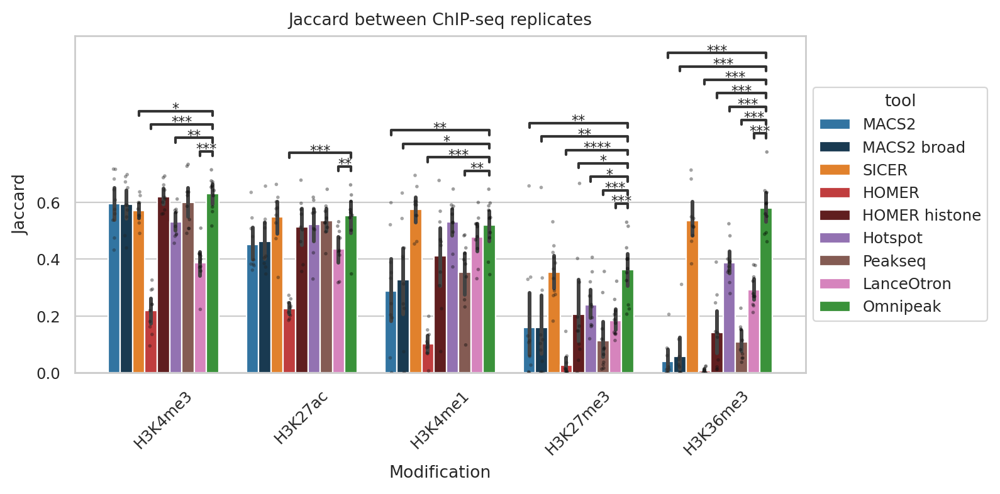

In [113]:
print('ENCODE + Roadmap')

sns.set_style("whitegrid")
t = pd.concat([df_encode_reps, df_immune_reps]).reset_index(drop=True)
plt.figure(figsize=(8, 4))
ax = plt.axes()
sns.barplot(data=t, x='modification', hue='tool', y='jaccard',
            palette=TOOLS_PALETTE,
            order=MODIFICATIONS,
            hue_order=TOOLS,
            # capsize=.2, err_kws={'linewidth': 2},
            ax=ax)
sns.stripplot(data=t, x='modification', hue='tool', y='jaccard',
              dodge=True, size=2, palette='dark:black',
              order=MODIFICATIONS,
              hue_order=TOOLS,
              legend=False, alpha=0.4,
              ax=ax)
# ax.set_ylim(0, 0.8)
ax.set_title('Jaccard between ChIP-seq replicates')
ax.set_ylabel('Jaccard')
ax.set_xlabel('Modification')
ax.xaxis.set_tick_params(rotation=45)
sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))

pairs = [((m, tool), (m, 'Omnipeak')) for m, tool in product(MODIFICATIONS, [t for t in TOOLS if t != 'Omnipeak'])]  # which groups to compare
annot = Annotator(ax, pairs, data=t, x='modification', hue='tool', y='jaccard', order=MODIFICATIONS, hue_order=TOOLS)
annot.configure(test='Mann-Whitney', comparisons_correction="BH", correction_format="replace", hide_non_significant=True,
                verbose=2,
                text_offset=-3, line_offset=0)
annot.apply_test()
annot.annotate()

ax.set_yticks(np.arange(0, 0.7, step=0.2), minor=False)

plt.tight_layout()
plt.show()

In [82]:
ts = []
# for df in [df_encode_reps, df_immune_reps, df_abf_reps]:
for df in [df_encode_reps, df_immune_reps]:
    t = pd.concat([df[['modification', 'cell', 'tool']],
                   df[['modification', 'cell', 'tool']]]).reset_index(drop=True)
    overlaps = [d(o, p) for o, p in zip(df['peaks1_overlap'], df['peaks1'])] + \
               [d(o, p) for o, p in zip(df['peaks2_overlap'], df['peaks2'])]
    t['overlap'] = overlaps
    ts.append(t)
t = pd.concat(ts).reset_index(drop=True)

All


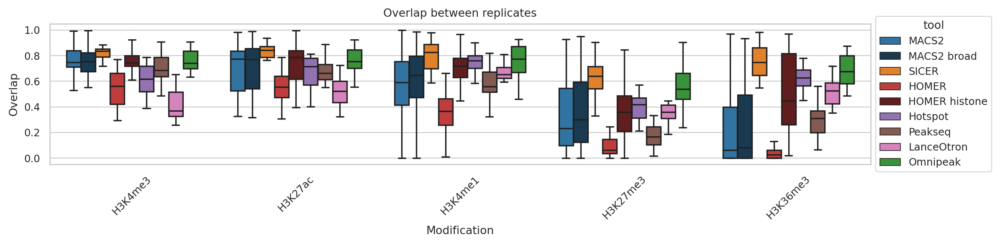

In [83]:
print('All')
sns.set_style("whitegrid")

plt.figure(figsize=(12, 3))
ax = plt.axes()
sns.boxplot(data=t, x='modification', hue='tool', y='overlap',
            palette=TOOLS_PALETTE,
            order=MODIFICATIONS,
            hue_order=TOOLS,
            showfliers=False,
            ax=ax)
sns.stripplot(data=t, x='modification', hue='tool', y='overlap',
              dodge=True, size=0.2, palette='dark:black', alpha=0.8,
              order=MODIFICATIONS,
              hue_order=TOOLS,
              legend=False,
              ax=ax)

ax.set_title('Overlap between replicates')
ax.set_ylabel('Overlap')
ax.set_xlabel('Modification')
ax.xaxis.set_tick_params(rotation=45)
sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

ENCODE + Roadmap


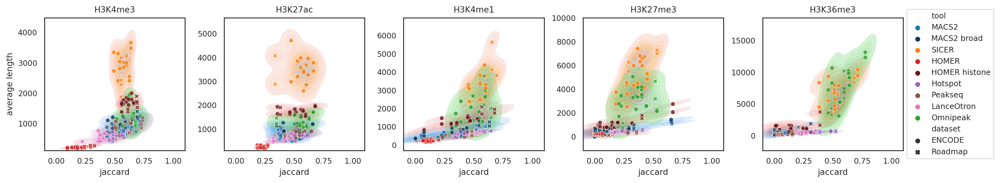

In [84]:
print('ENCODE + Roadmap')
sns.set_style("white")
# t = df_jaccard_avg_len_encode
df_jaccard_avg_len_encode['dataset'] = 'ENCODE'
df_jaccard_avg_len_immune['dataset'] = 'Roadmap'
t = pd.concat([df_jaccard_avg_len_encode, df_jaccard_avg_len_immune]).reset_index(drop=True)
plt.figure(figsize=(16, 3))
axs = [plt.subplot(1, 5, i + 1) for i in range(5)]
for i, m in enumerate(MODIFICATIONS):
    ax = axs[i]
    sns.kdeplot(
        t[t['modification'] == m],
        palette=TOOLS_PALETTE,
        hue_order=TOOLS,
        x='jaccard', y='average_len', hue='tool', alpha=0.3,
        common_norm=False, common_grid=False,
        thresh=.05,
        fill=True,
        ax=ax,
    )
    sns.scatterplot(
        t[t['modification'] == m],
        palette=TOOLS_PALETTE,
        hue_order=TOOLS,
        style='dataset',
        x='jaccard', y='average_len', hue='tool', alpha=0.8,
        ax=ax,
    )
    # ax.set_title(m)
    ax.set_xlim(-0.1, 1.1)
    ax.set_title(m)
    if i > 0:
        ax.set_ylabel(None)
    else:
        ax.set_ylabel('average length')
    if i < len(axs) - 1:
        ax.legend().set_visible(False)
    else:
        # Put a legend to the right of the current axis
        ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

## Jaccard ABF

In [85]:
df_abf_reps_path = ABF_PATH + '/overlap.tsv'
df_abf_reps = load_or_compute(df_abf_reps_path, lambda: compute_reps_overlap(df_abf_peaks))

ABF
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

H3K36me3_LanceOtron vs. H3K36me3_Omnipeak: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.298e-61 U_stat=1.448e+03
H3K4me3_LanceOtron vs. H3K4me3_Omnipeak: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.050e-40 U_stat=1.041e+04
H3K4me1_LanceOtron vs. H3K4me1_Omnipeak: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.178e-22 U_stat=1.406e+04
H3K27me3_LanceOtron vs. H3K27me3_Omnipeak: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.919e-77 U_stat=1.090e+03
H3K36me3_Peakseq vs. H3K36me3_Omnipeak: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:8.130e-66 U_stat=7.360e+02
H3K4me3_Peakseq vs. H3K4me3_Omnipeak: Mann-Whitney-Wilcoxon test t

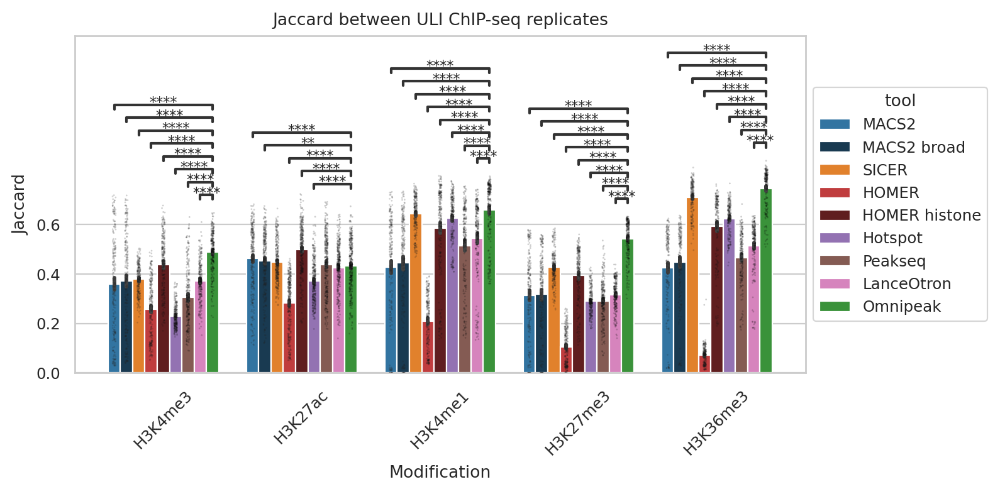

In [115]:
print('ABF')
sns.set_style("whitegrid")
plt.figure(figsize=(8, 4))
ax = plt.axes()
sns.barplot(data=df_abf_reps, x='modification', hue='tool', y='jaccard',
            order=MODIFICATIONS,
            palette=TOOLS_PALETTE,
            hue_order=TOOLS,
            # capsize=.2, err_kws={'linewidth': 2},
            ax=ax)
sns.stripplot(data=df_abf_reps, x='modification', hue='tool', y='jaccard',
              dodge=True, size=1, palette='dark:black', alpha=0.2,
              order=MODIFICATIONS,
              hue_order=TOOLS,
              legend=False,
              ax=ax)
ax.set_title('Jaccard between ULI ChIP-seq replicates')
ax.set_ylabel('Jaccard')
ax.set_xlabel('Modification')
ax.xaxis.set_tick_params(rotation=45)
sns.move_legend(ax, loc='center left', bbox_to_anchor=(1, 0.5))

pairs = [((m, tool), (m, 'Omnipeak')) for m, tool in product(MODIFICATIONS, [t for t in TOOLS if t != 'Omnipeak'])]  # which groups to compare
annot = Annotator(ax, pairs, data=df_abf_reps, x='modification', hue='tool', y='jaccard', order=MODIFICATIONS, hue_order=TOOLS)
annot.configure(test='Mann-Whitney', comparisons_correction="BH", correction_format="replace", hide_non_significant=True,
                verbose=2,
                text_offset=-3, line_offset=0)
annot.apply_test()
annot.annotate()

ax.set_yticks(np.arange(0, 0.7, step=0.2), minor=False)

plt.tight_layout()
plt.show()

# END